In [ ]:
!pip uninstall -y keras tensorflow
!pip install -U tensorflow keras scikeras


Found existing installation: keras 2.15.0
Uninstalling keras-2.15.0:
  Successfully uninstalled keras-2.15.0
Found existing installation: tensorflow 2.15.0
Uninstalling tensorflow-2.15.0:
  Successfully uninstalled tensorflow-2.15.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 67.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 86.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 67.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 81.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 29.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 82.4 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: h5py
    Found ex

In [ ]:
!pip install pynrrd
!pip install SimpleITK
!pip install scikit-learn
!pip install scikit-image
!pip install matplotlib

import os
import numpy as np
import SimpleITK as sitk
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 4.4 MB/s eta 0:00:00


ValueError: mount failed

In [ ]:
from google.colab import drive
# 1. Mount Google Drive and Define Paths
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
data_root = '/content/drive/My Drive/MASK'

Mounted at /content/drive


In [ ]:
# 2. Generate Dataset Paths
dataset_paths = []
subfolders = [f.path for f in os.scandir(data_root) if f.is_dir()]
for folder in subfolders:
    images = [os.path.join(folder, f) for f in os.listdir(folder) if f.endswith('.nrrd') or f.endswith('.seg.nrrd')]
    dataset_paths.extend(images)
print(f"Found {len(dataset_paths)} images.")

Found 105 images.


In [ ]:
def load_and_preprocess_from_path(image_path, mask_suffix='MASK.nrrd'):
    # Example:  Adds "MASK" before .nrrd if not already present
    if(not image_path.endswith("MASK.nrrd")):
      base_path = image_path.replace('.nrrd', '')
      mask_path = base_path + mask_suffix
      return mask_path
    return image_path

preprocessed_images = []
original_images = []  # If needed, for visualization like in Grad-CAM

for image_path in dataset_paths:
    preprocessed_image = load_and_preprocess_from_path(image_path)
    preprocessed_images.append(preprocessed_image)
    # Load original image for visualization if necessary
    # original_images.append(load_original_image_for_visualization(image_path))

print(preprocessed_images)

['/content/drive/My Drive/MASK/noMETA/01MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/02MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/03MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/01MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/02MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/03MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/05MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/05MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/06MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/06MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/07MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/07MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/09MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/09MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/11MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/11MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/12MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/12MASK.nrrd', '/content/drive/My Drive/MASK/noMETA/14MASK.nrrd', '/content/drive/My Drive/MASK/


Processing images in noMETA folder...
Mean before normalization: 154.4708545770006
Standard deviation before normalization: 21.589611529455034


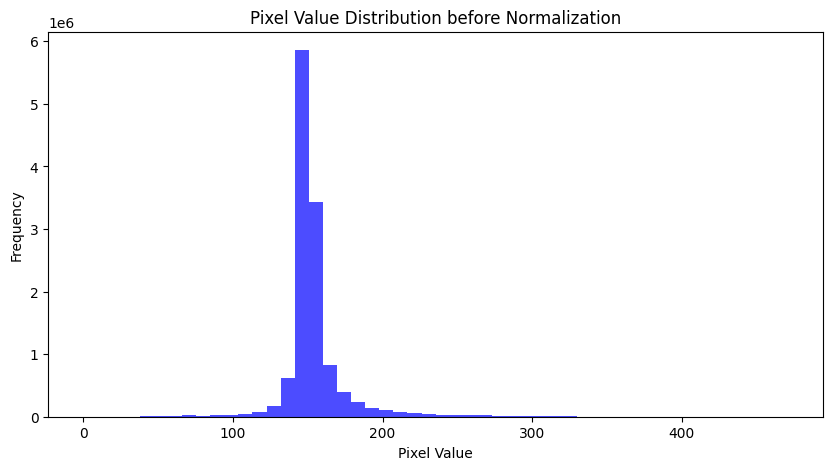

Mean after normalization: 5.810817317623873e-14
Standard deviation after normalization: 100.00000000000004


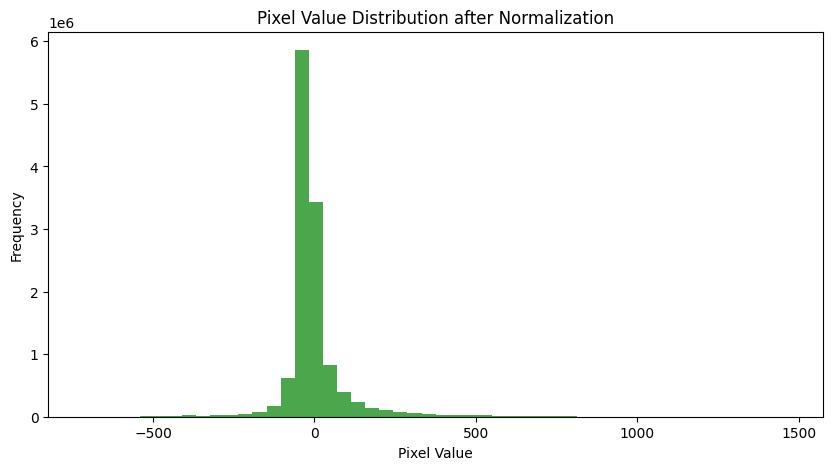

Interval where most values are located (IQR): -67.02693356597825 - 44.1376418931792


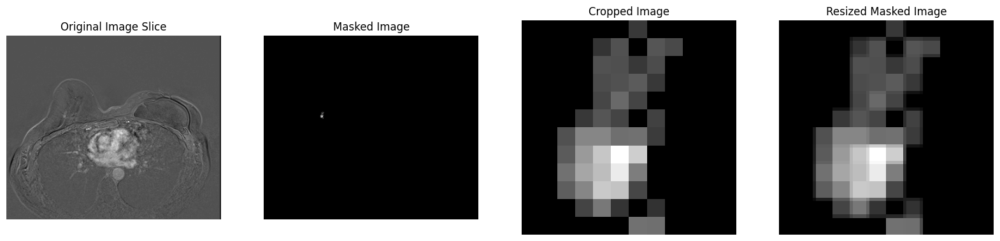

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/01.png
Mean before normalization: 161.23098307291667
Standard deviation before normalization: 32.44072861661606


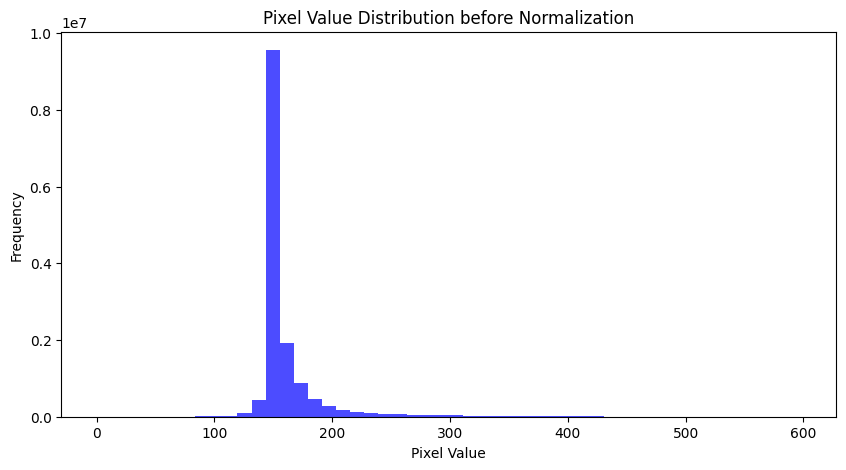

Mean after normalization: -1.6769805816900835e-14
Standard deviation after normalization: 100.00000000000018


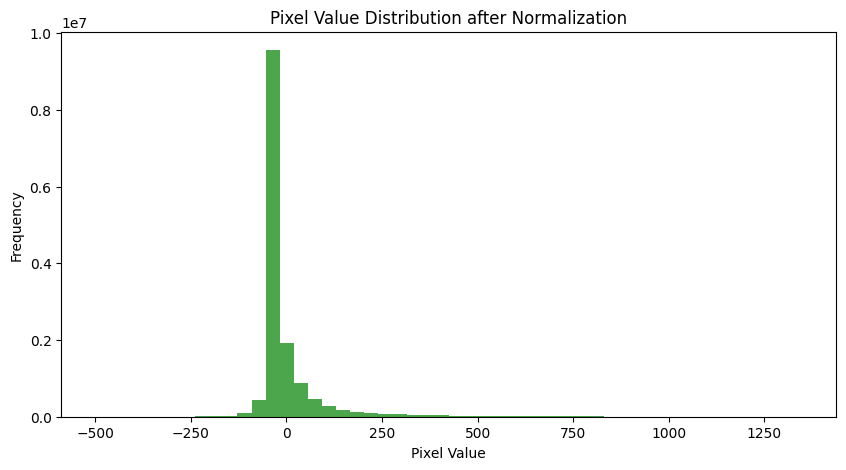

Interval where most values are located (IQR): -76.23436379986089 - 34.737249770991156


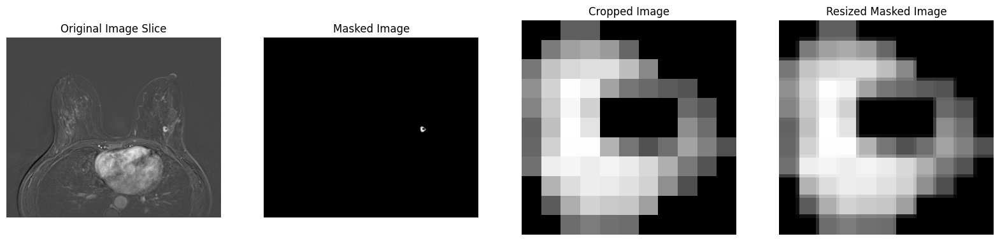

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/02.png
Mean before normalization: 153.54212233323318
Standard deviation before normalization: 17.082836830077973


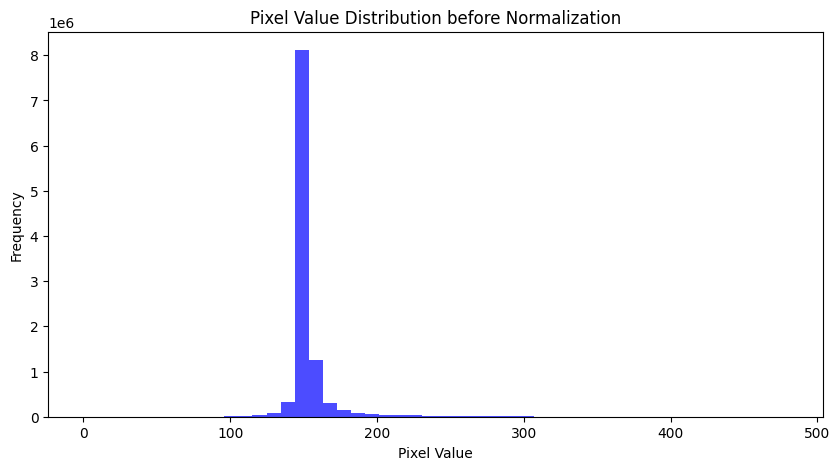

Mean after normalization: -4.887440879359089e-14
Standard deviation after normalization: 100.0000000000003


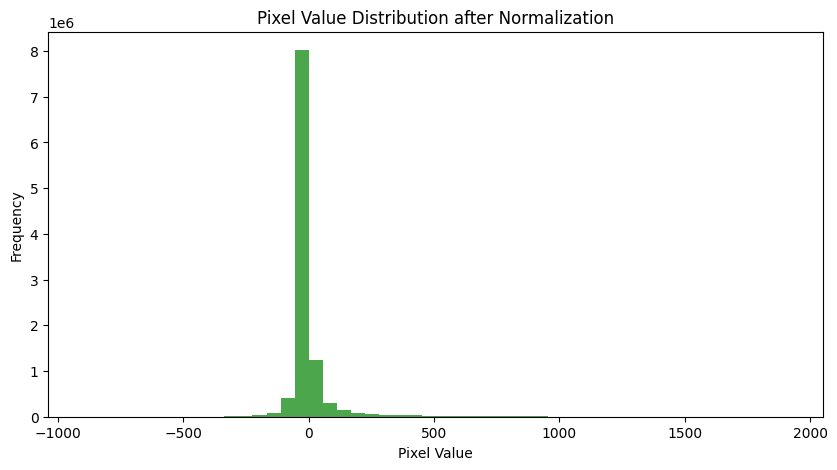

Interval where most values are located (IQR): -38.296463276605095 - 8.534166083000423


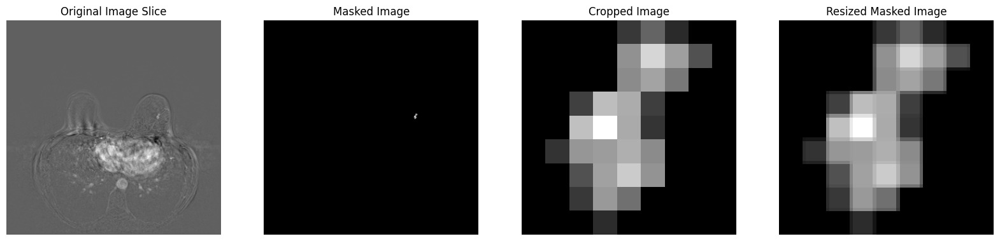

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/03.png
Mean before normalization: 160.25273805023522
Standard deviation before normalization: 26.894610481948455


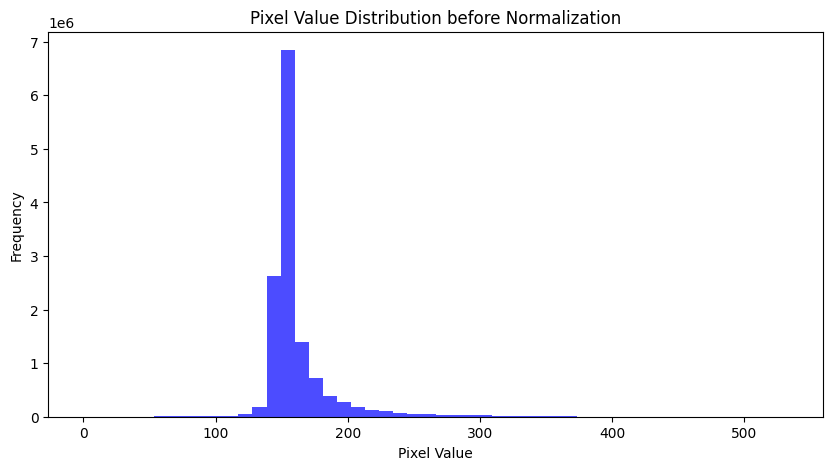

Mean after normalization: -2.68019776026498e-14
Standard deviation after normalization: 100.00000000000004


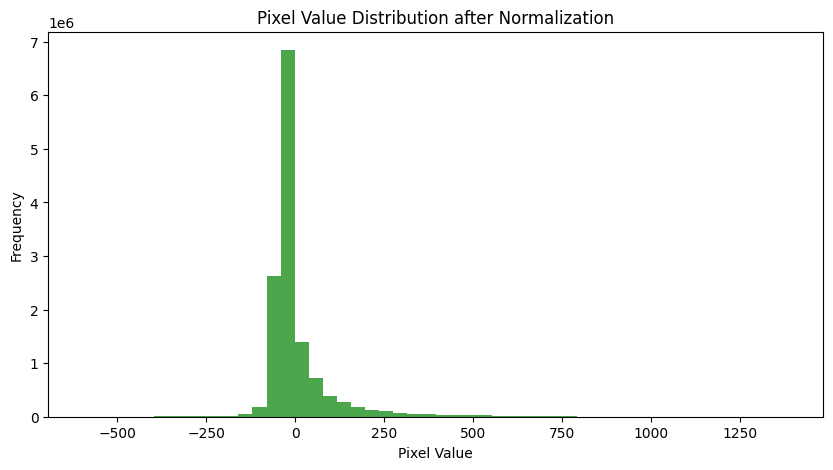

Interval where most values are located (IQR): -99.4724875015072 - 64.12906393026611


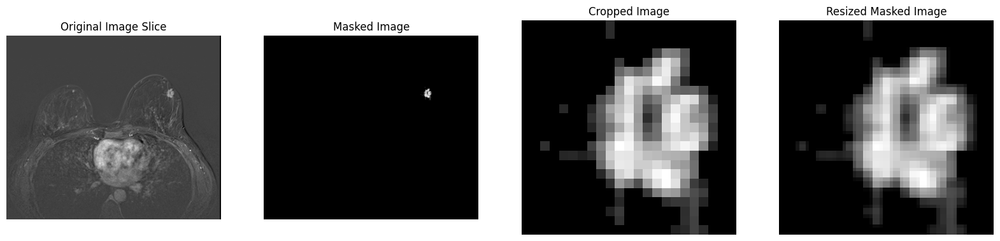

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/05.png
Mean before normalization: 156.18276739739753
Standard deviation before normalization: 24.16089359116658


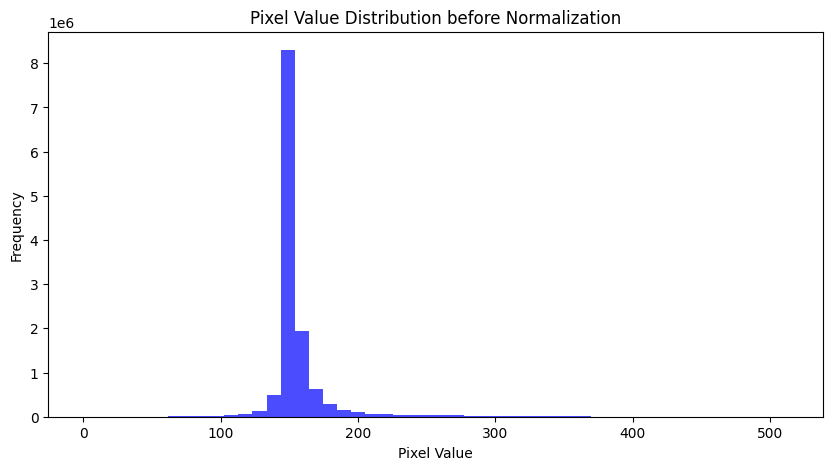

Mean after normalization: -1.2711332707916077e-14
Standard deviation after normalization: 100.00000000000001


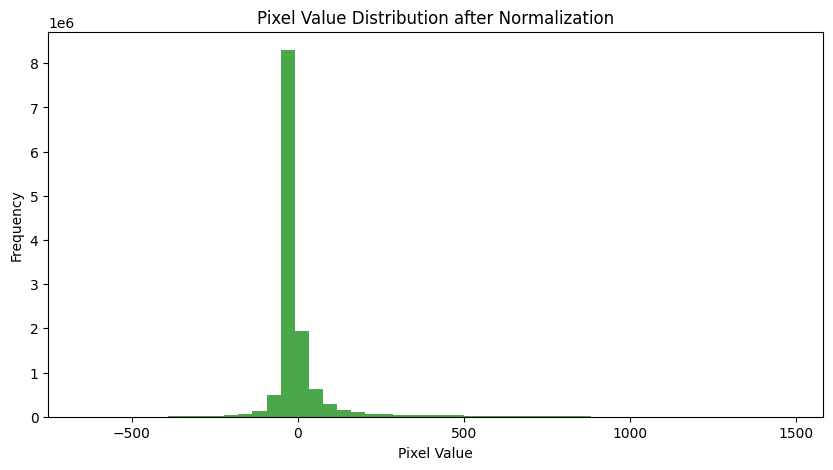

Interval where most values are located (IQR): -56.631876407088086 - 26.146518872597095


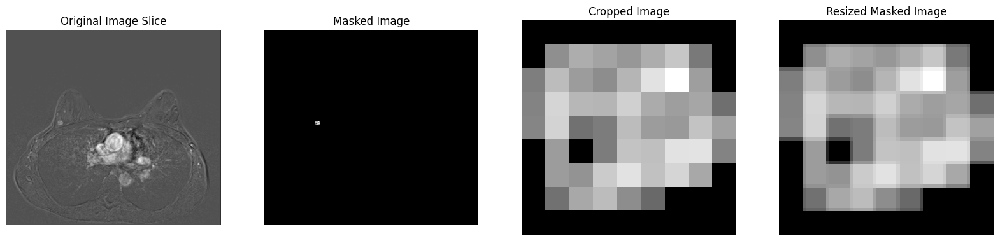

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/06.png
Mean before normalization: 158.6967635543258
Standard deviation before normalization: 24.8809551942395


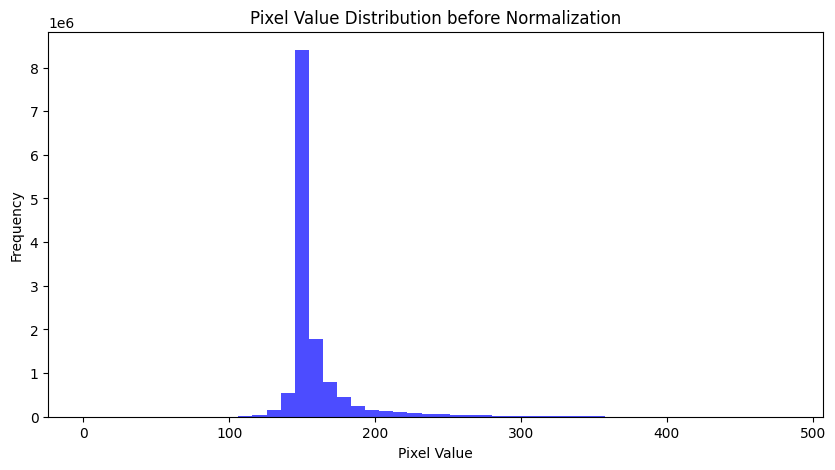

Mean after normalization: 4.616115445992083e-14
Standard deviation after normalization: 100.00000000000004


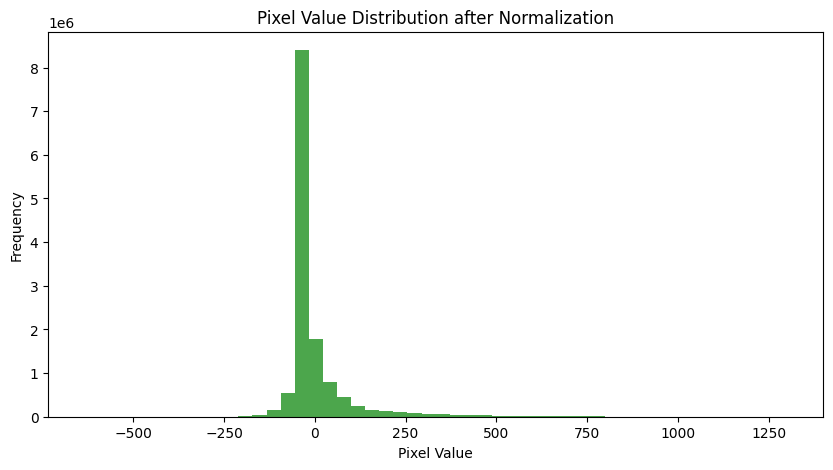

Interval where most values are located (IQR): -83.1831551190509 - 45.429270530140876


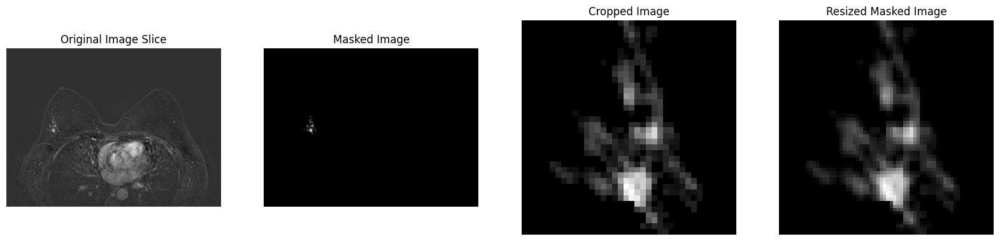

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/07.png
Mean before normalization: 53.692423806662084
Standard deviation before normalization: 17.62720942012117


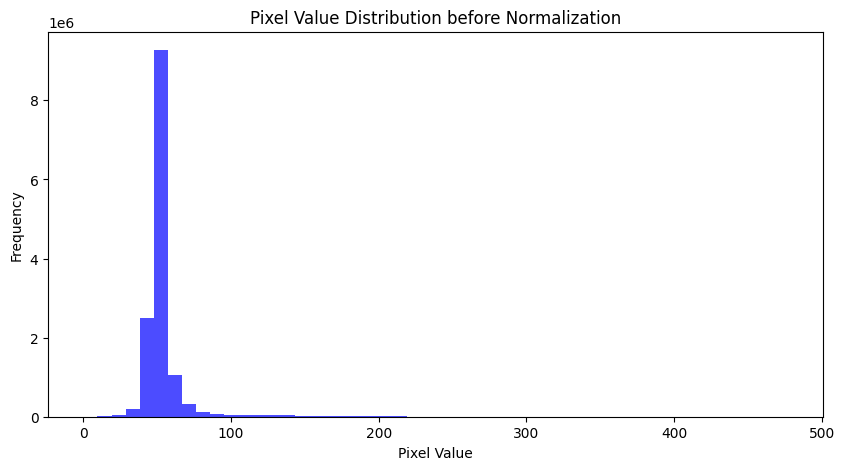

Mean after normalization: 1.14467653914759e-14
Standard deviation after normalization: 100.00000000000017


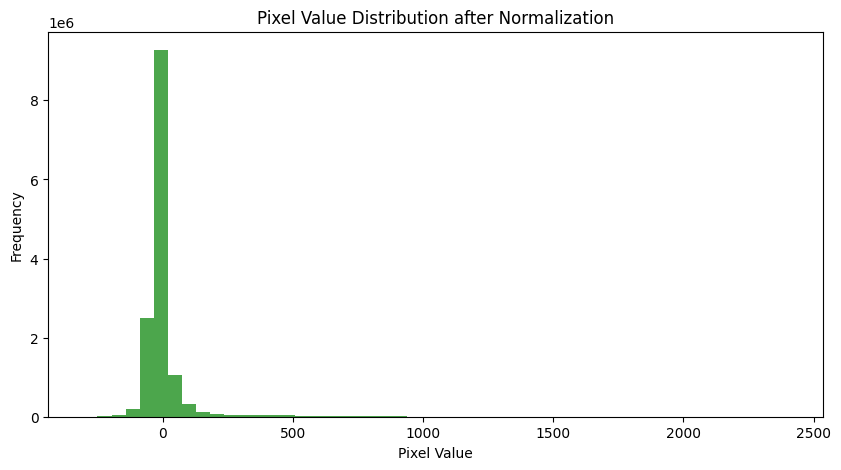

Interval where most values are located (IQR): -74.84124963990698 - 38.61970452093897


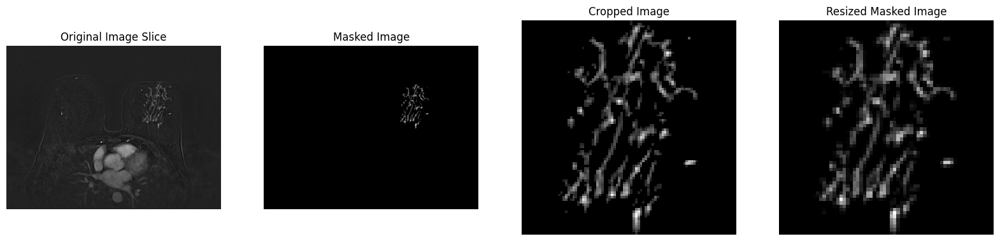

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/09.png
Mean before normalization: 160.4226732772436
Standard deviation before normalization: 27.12529674444154


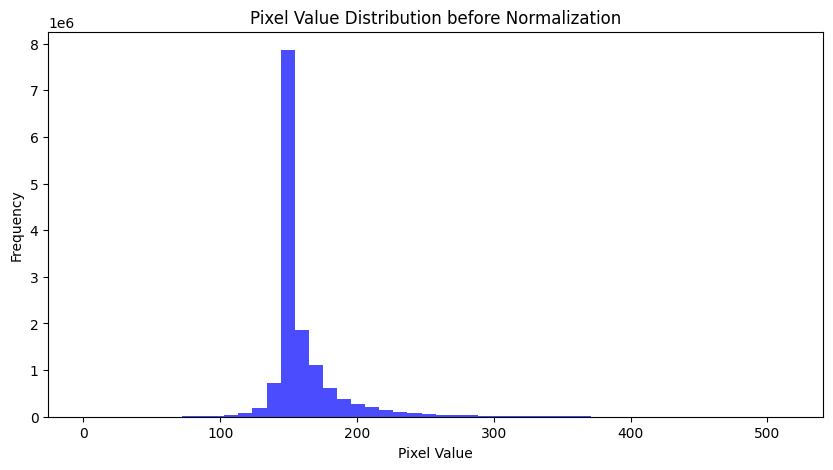

Mean after normalization: -5.03980414584772e-14
Standard deviation after normalization: 99.99999999999996


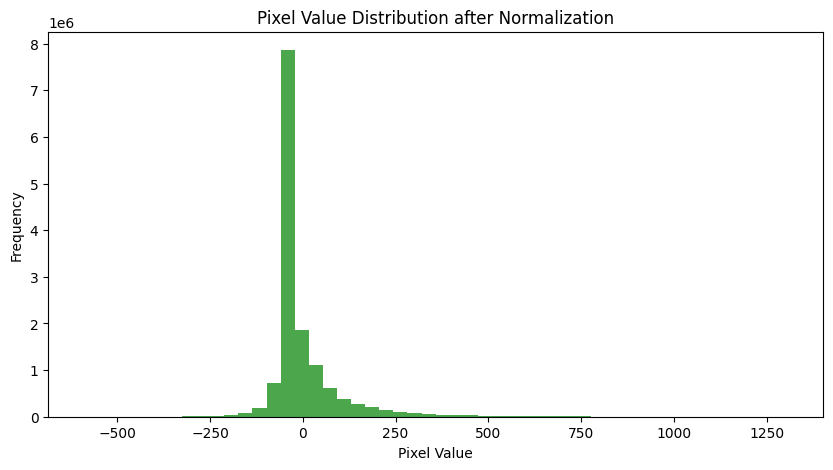

Interval where most values are located (IQR): -113.99939166962373 - 77.70358024590283


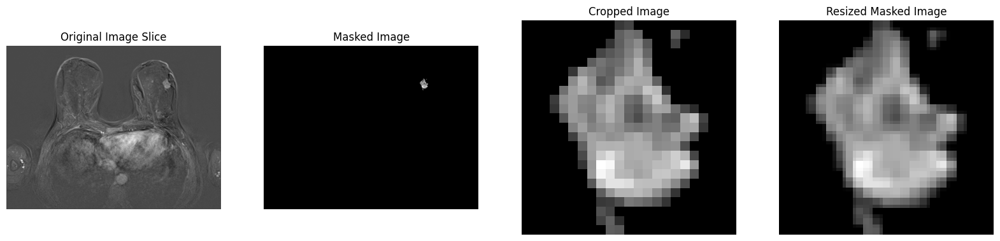

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/11.png
Mean before normalization: 154.98381345501434
Standard deviation before normalization: 24.452286325263998


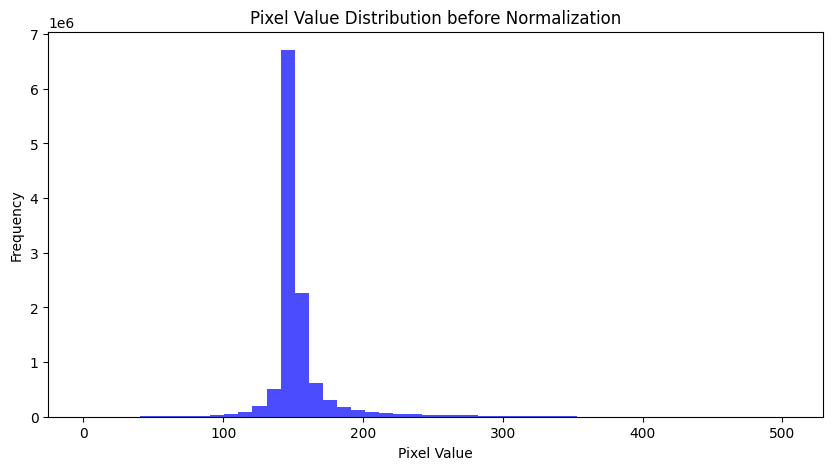

Mean after normalization: 1.755974986874034e-17
Standard deviation after normalization: 99.99999999999996


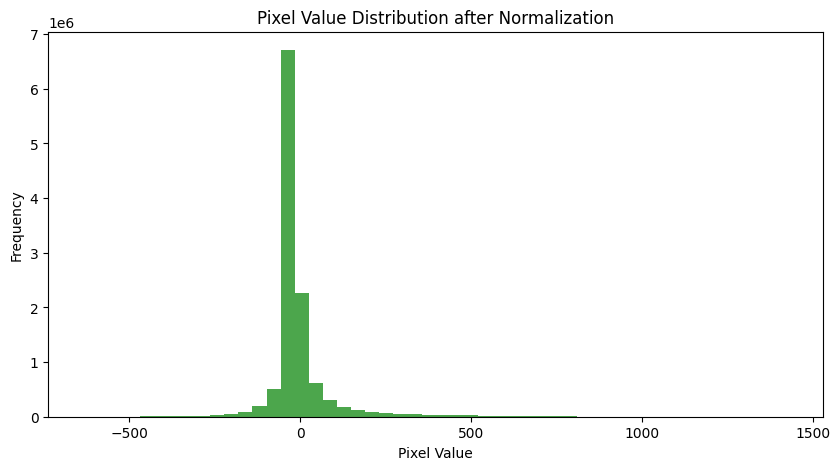

Interval where most values are located (IQR): -55.14336481935812 - 26.648577798850503


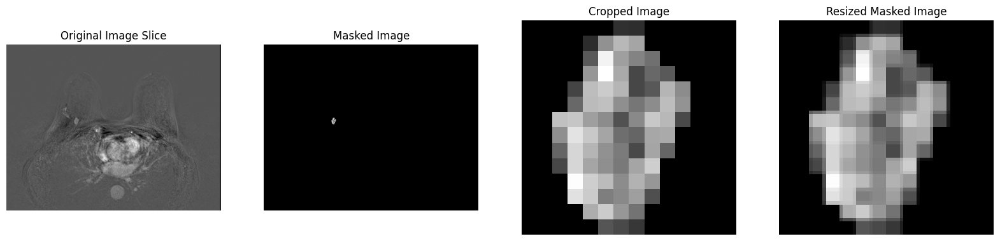

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/12.png
Mean before normalization: 158.9196970867674
Standard deviation before normalization: 26.169480571045646


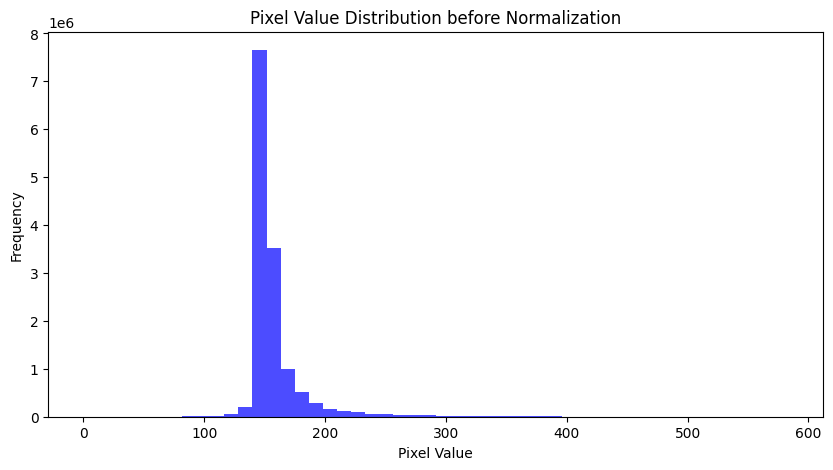

Mean after normalization: 1.9697389832353254e-15
Standard deviation after normalization: 100.00000000000004


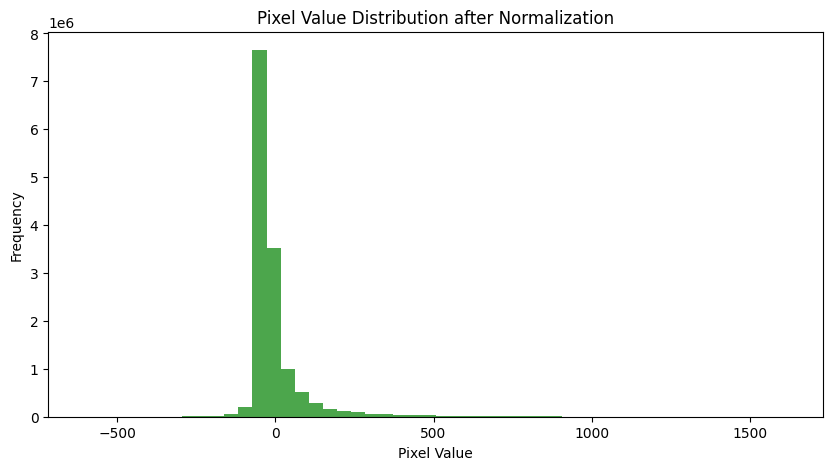

Interval where most values are located (IQR): -79.93929046460823 - 42.34055346704906


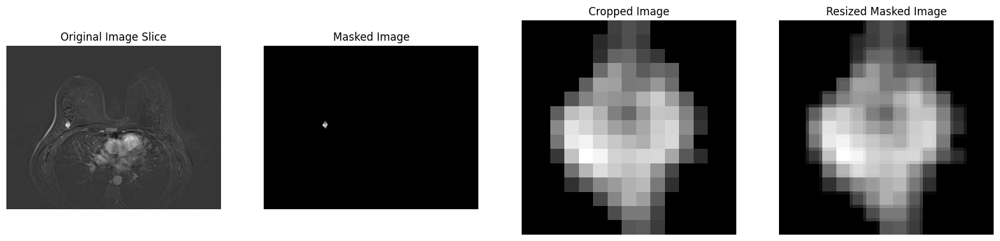

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/14.png
Mean before normalization: 156.96291932714584
Standard deviation before normalization: 21.85097297959182


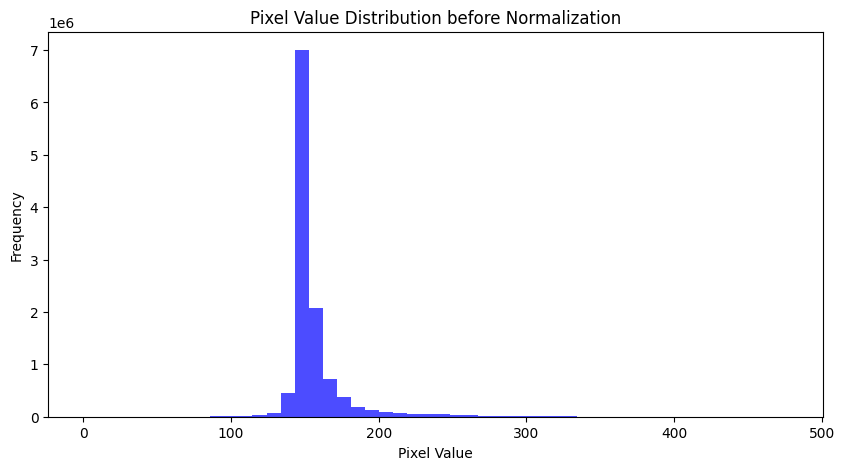

Mean after normalization: 5.614792733922112e-14
Standard deviation after normalization: 99.99999999999996


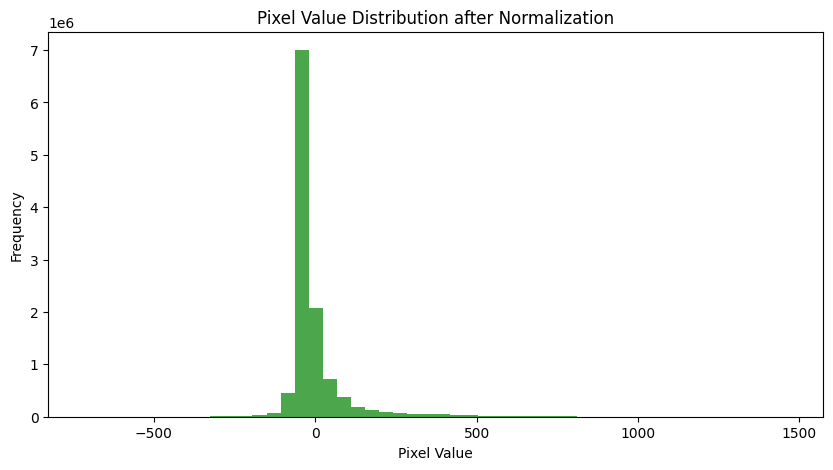

Interval where most values are located (IQR): -84.49472407654191 - 43.646022910565655


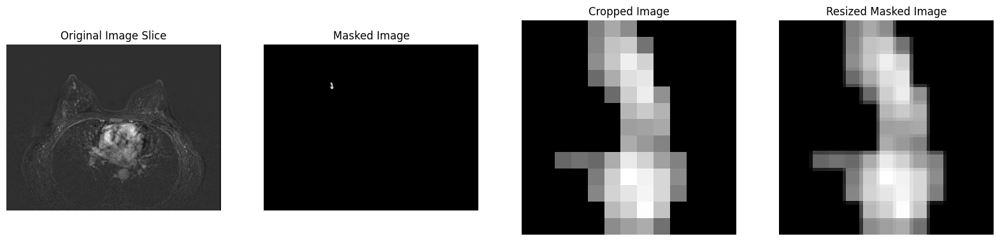

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/101.png
Mean before normalization: 0.8974175347222222
Standard deviation before normalization: 5.635141138494363


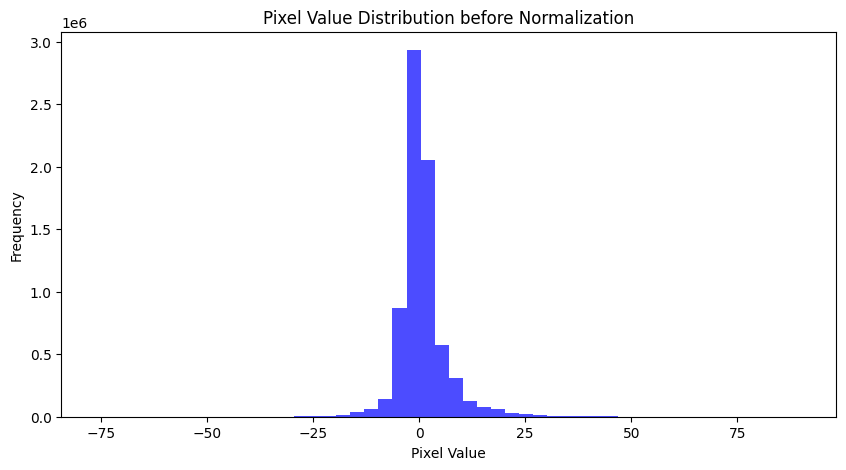

Mean after normalization: -1.1842378929335004e-17
Standard deviation after normalization: 100.00000000000003


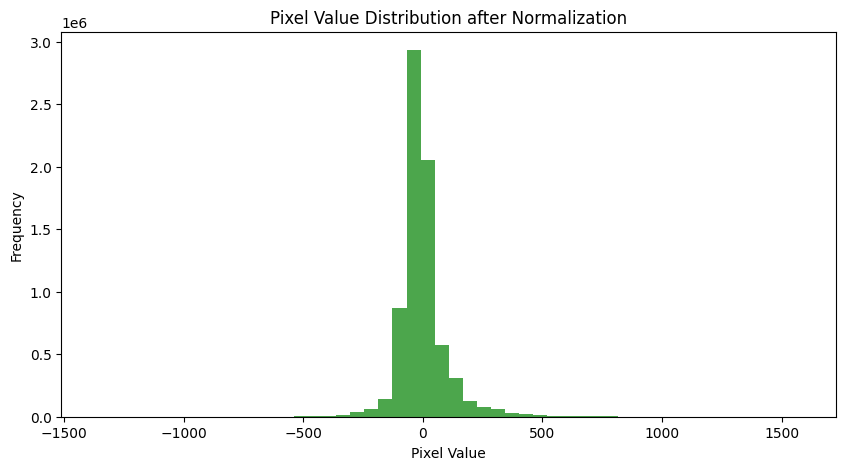

Interval where most values are located (IQR): -113.5271926202638 - 99.42222080305721


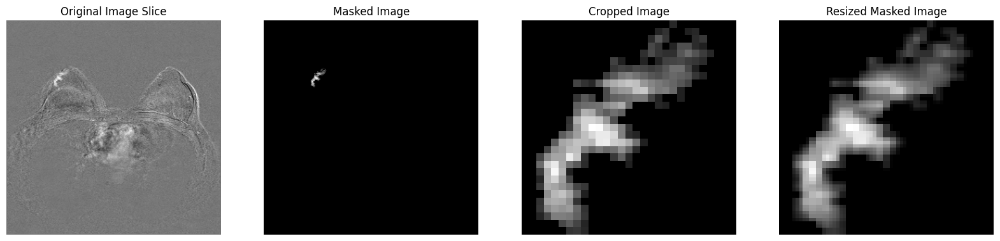

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/102.png
Mean before normalization: 154.77448266601561
Standard deviation before normalization: 18.93593604537399


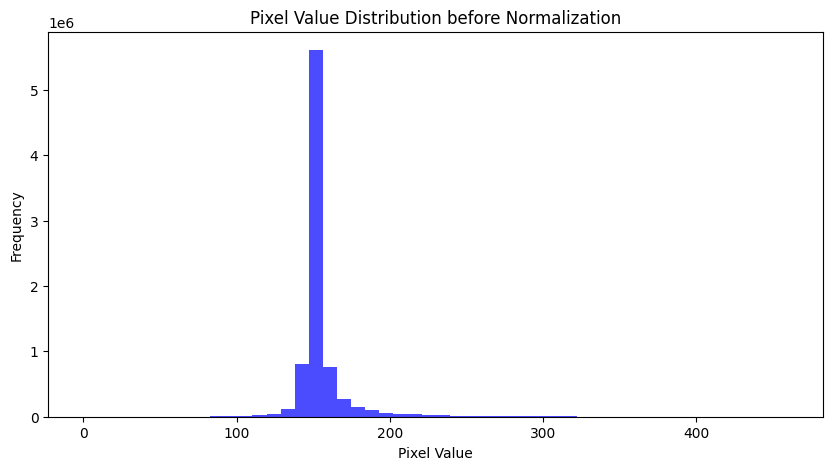

Mean after normalization: 5.477573949974612e-14
Standard deviation after normalization: 100.00000000000004


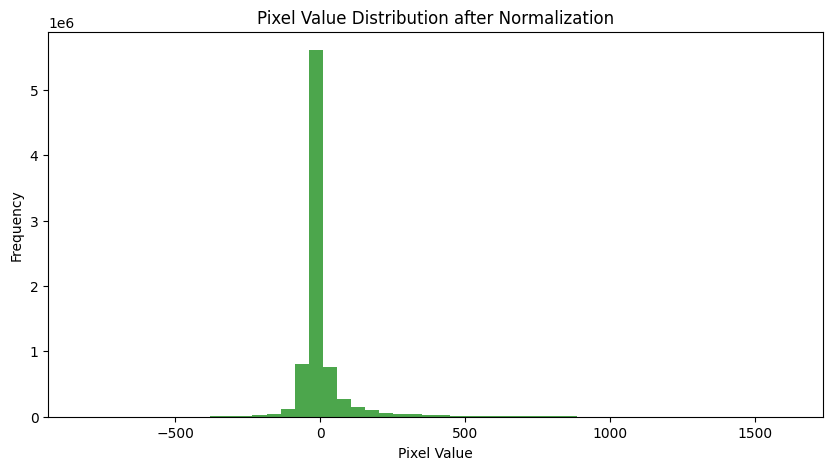

Interval where most values are located (IQR): -56.89965703410684 - 27.59576987091149


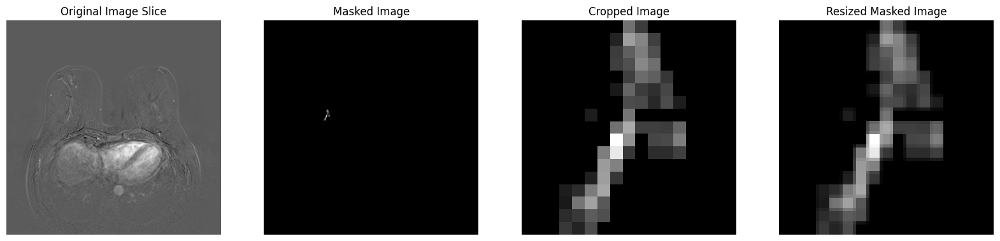

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/166.png
Mean before normalization: 155.98800551977604
Standard deviation before normalization: 24.473376120398637


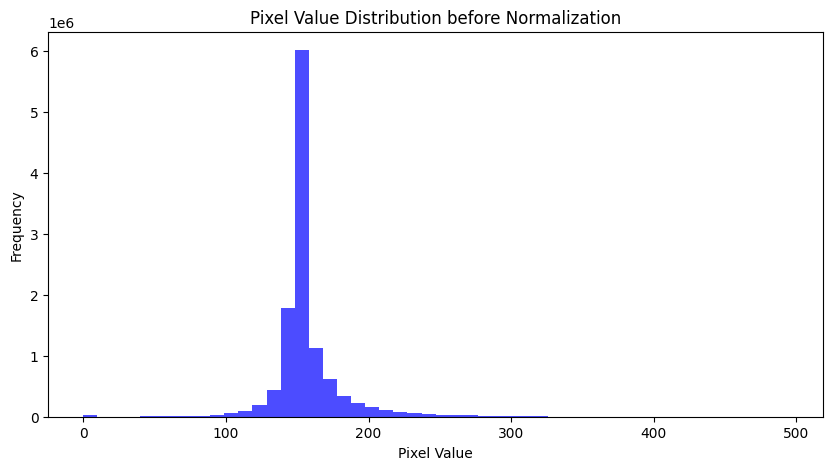

Mean after normalization: -1.3688452156606979e-14
Standard deviation after normalization: 99.99999999999982


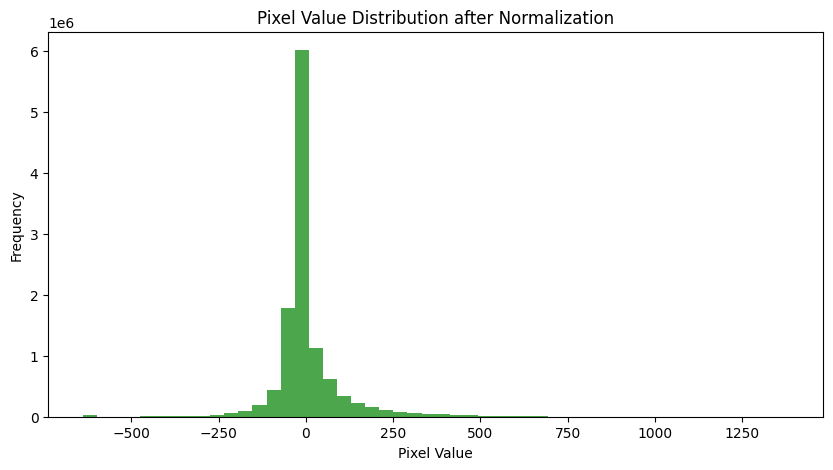

Interval where most values are located (IQR): -89.84459443439422 - 73.59832330289285


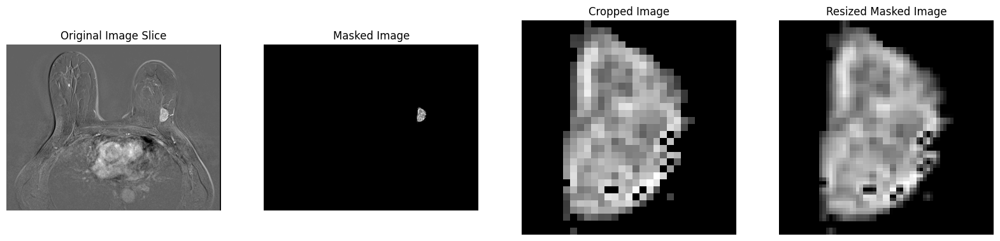

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/103.png
Mean before normalization: 162.02479945943813
Standard deviation before normalization: 34.2547657171575


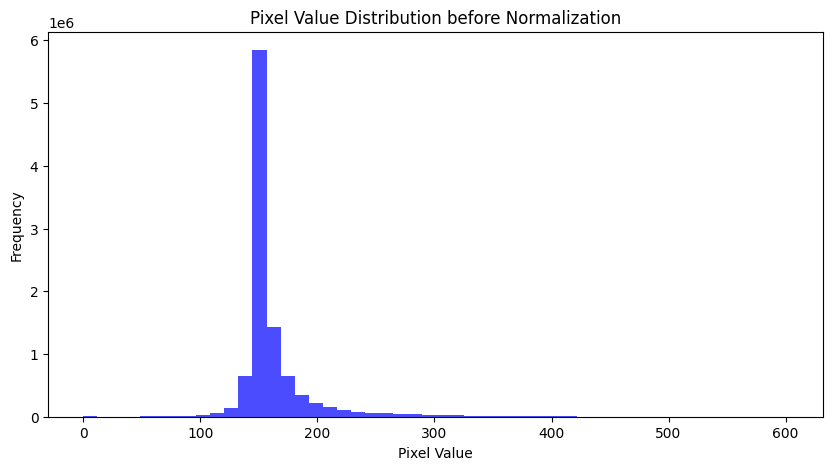

Mean after normalization: 1.3082598977207179e-14
Standard deviation after normalization: 99.99999999999999


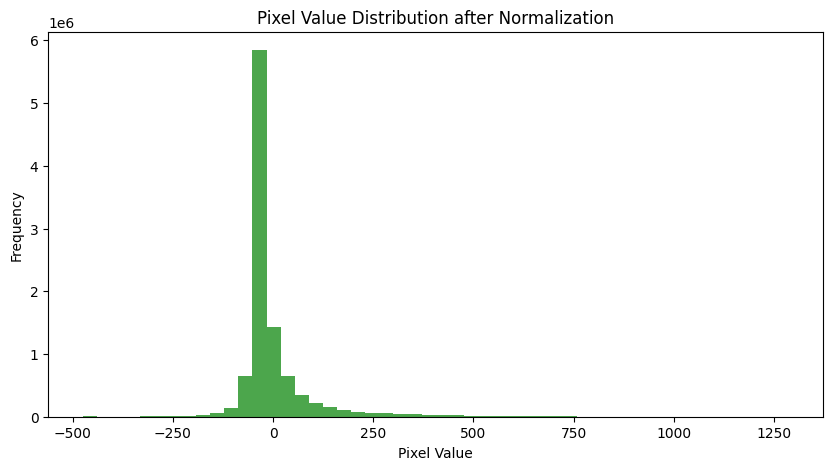

Interval where most values are located (IQR): -94.94970635034045 - 56.853988438774095


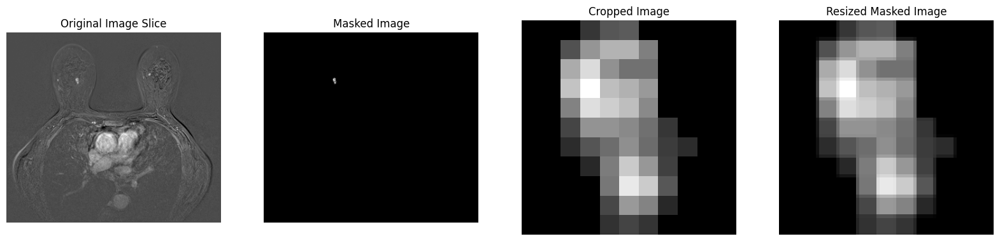

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/104.png
Mean before normalization: 158.57895757237554
Standard deviation before normalization: 27.77117992508548


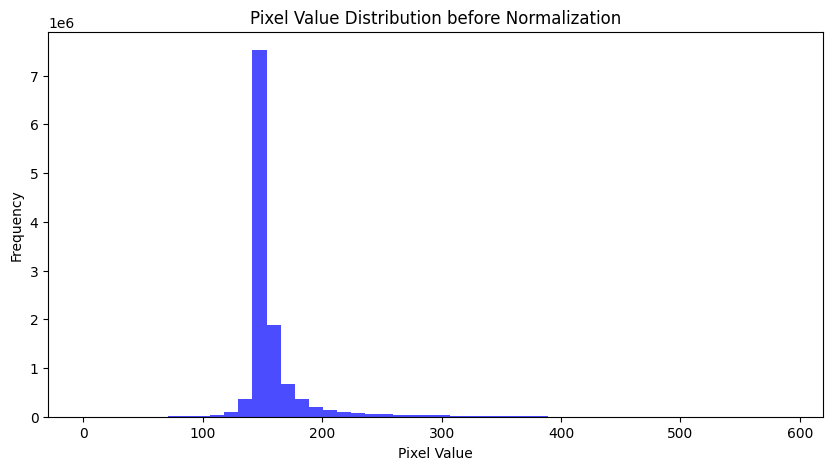

Mean after normalization: -9.823330220447861e-15
Standard deviation after normalization: 100.00000000000004


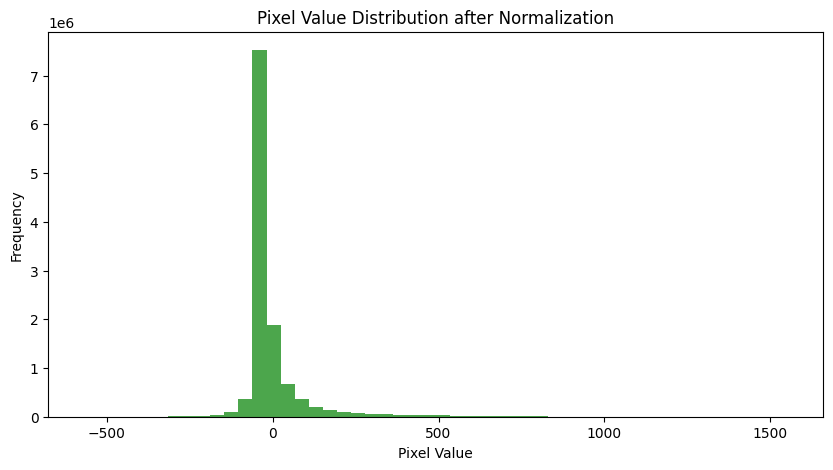

Interval where most values are located (IQR): -68.70056520407934 - 32.12338277195832


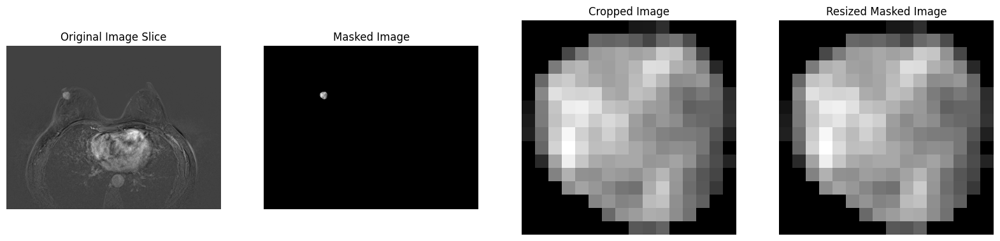

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/106.png
Mean before normalization: 160.9174337121212
Standard deviation before normalization: 34.49601383078062


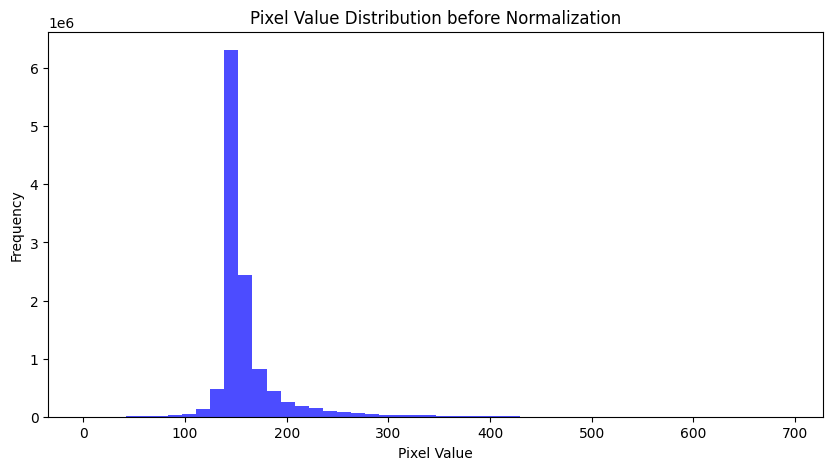

Mean after normalization: 7.908863559248353e-15
Standard deviation after normalization: 100.00000000000014


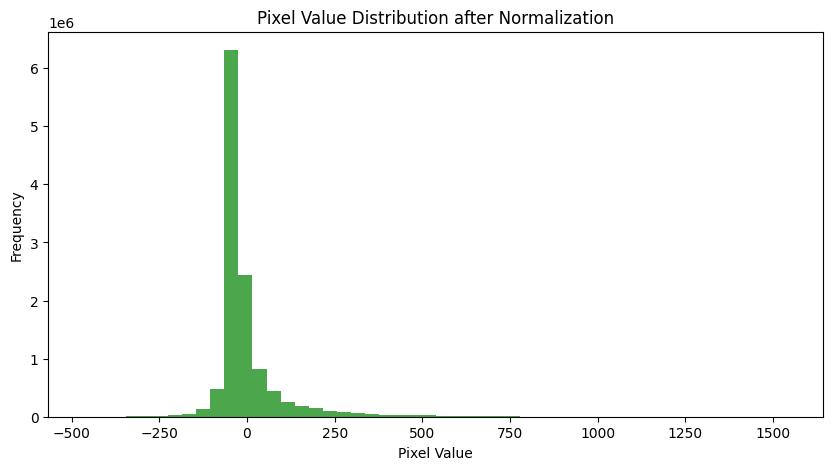

Interval where most values are located (IQR): -86.72721972712696 - 52.41929220165088


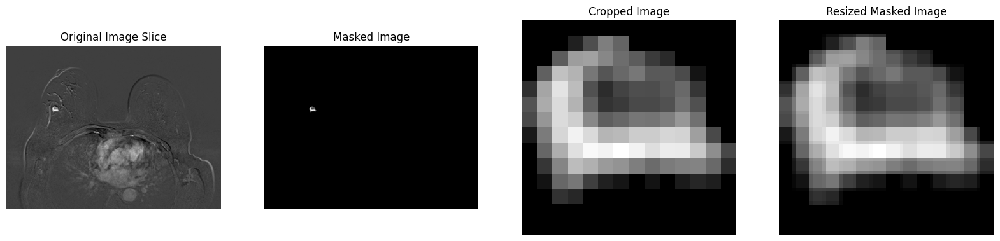

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/107.png
Mean before normalization: 157.37352549027423
Standard deviation before normalization: 23.786106488857772


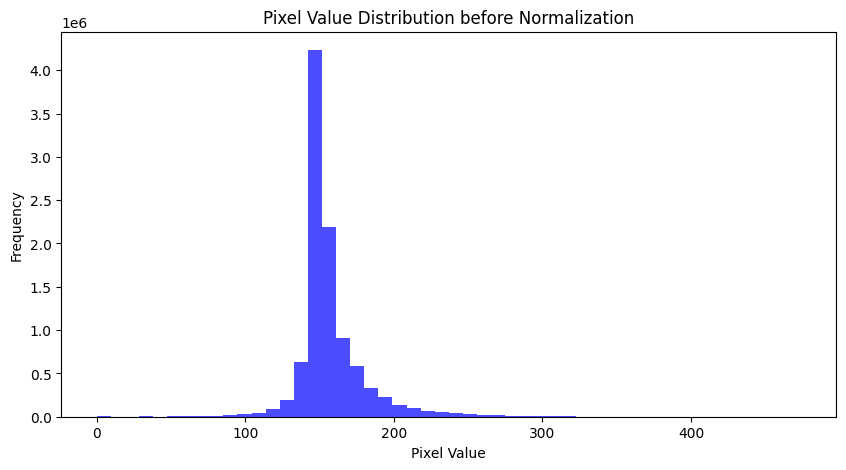

Mean after normalization: 8.984740389325675e-15
Standard deviation after normalization: 100.00000000000009


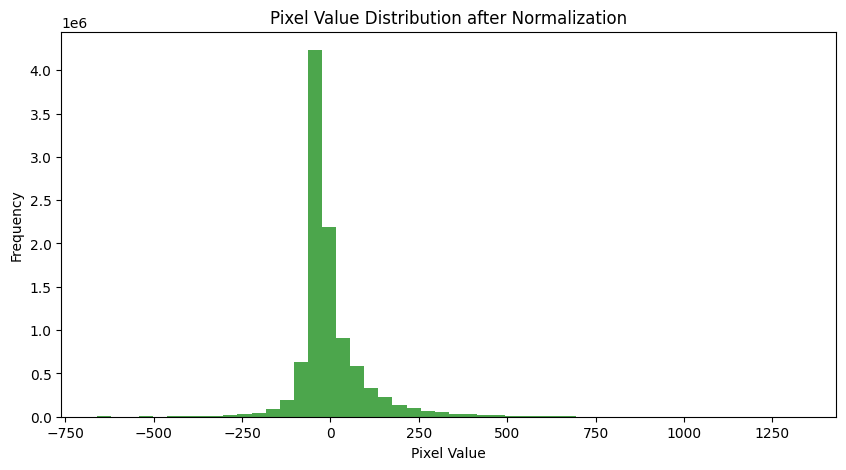

Interval where most values are located (IQR): -117.18406080175899 - 101.43095306929462


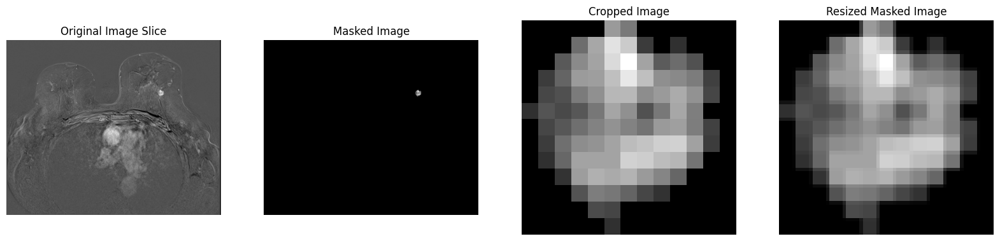

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/109.png
Mean before normalization: 158.15243638392857
Standard deviation before normalization: 24.74083731416536


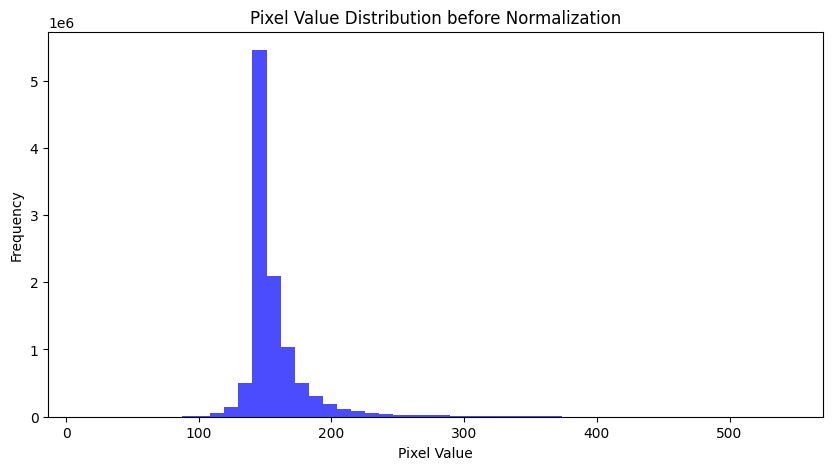

Mean after normalization: -1.0239935883354129e-14
Standard deviation after normalization: 100.00000000000006


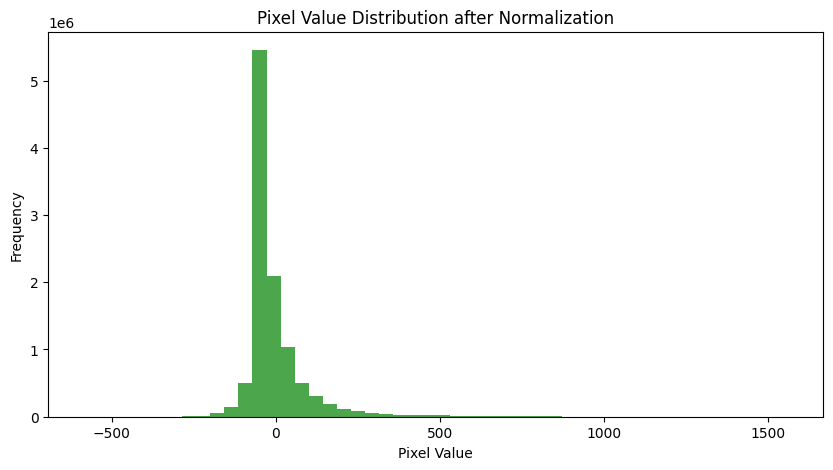

Interval where most values are located (IQR): -103.68459263600299 - 74.1590245434682


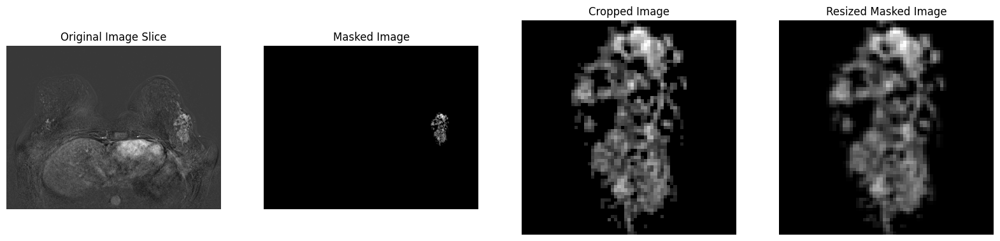

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/110.png
Mean before normalization: 2.03994384765625
Standard deviation before normalization: 10.029695177242905


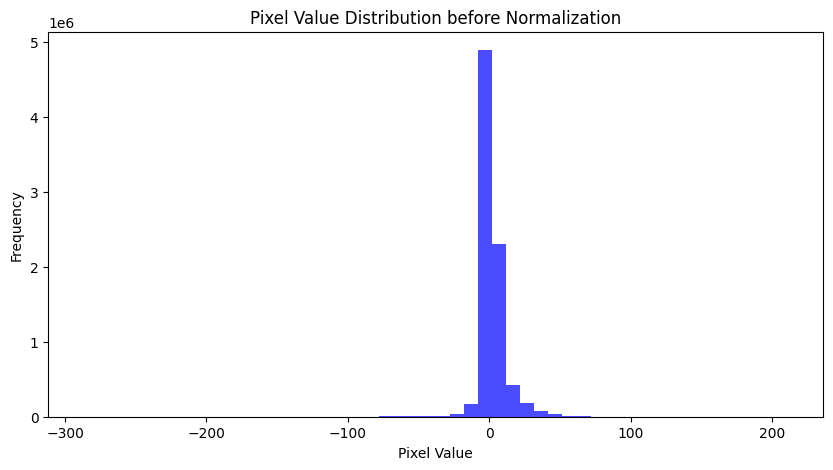

Mean after normalization: 2.064126647383091e-15
Standard deviation after normalization: 99.99999999999991


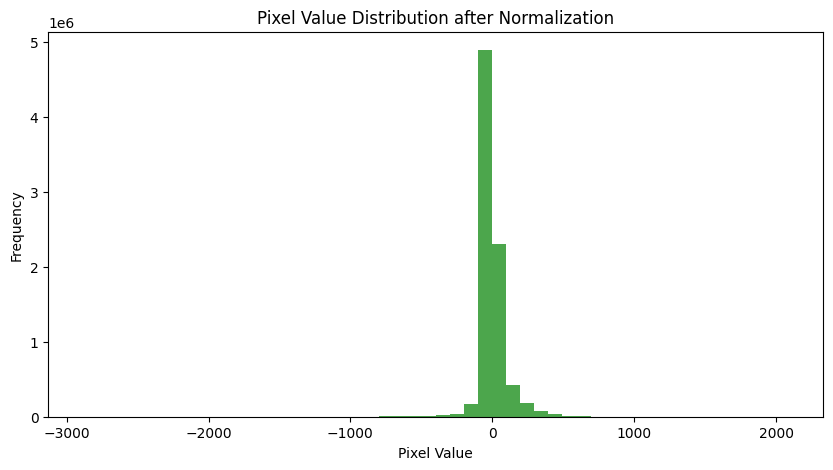

Interval where most values are located (IQR): -90.13179052707034 - 69.39449334547993


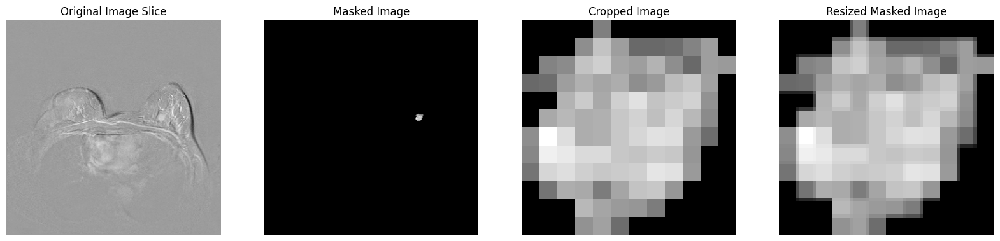

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/111.png
Mean before normalization: 152.20629228071732
Standard deviation before normalization: 19.61727253424769


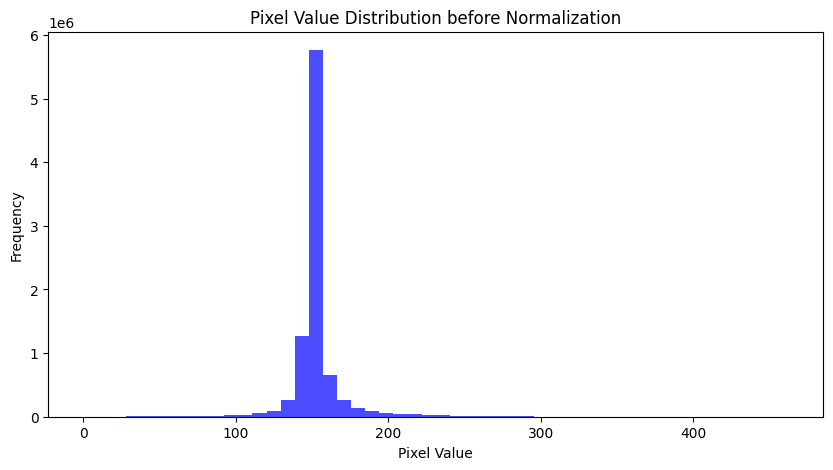

Mean after normalization: 4.559423545784243e-14
Standard deviation after normalization: 100.00000000000001


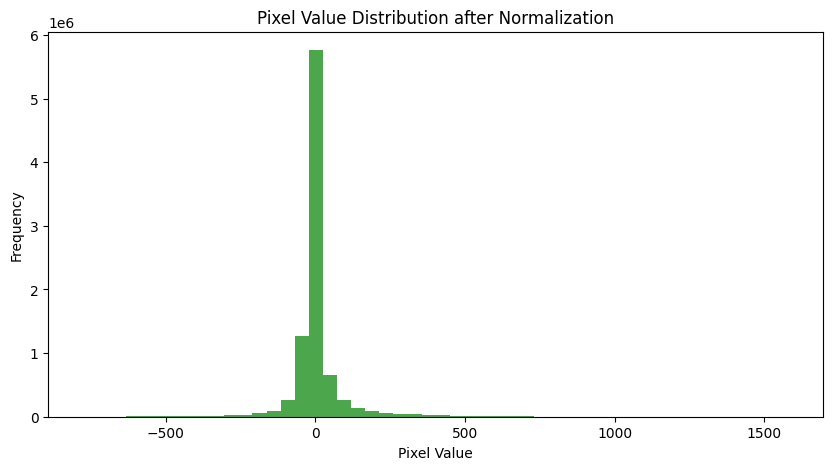

Interval where most values are located (IQR): -46.92952225975881 - 34.63125522379462


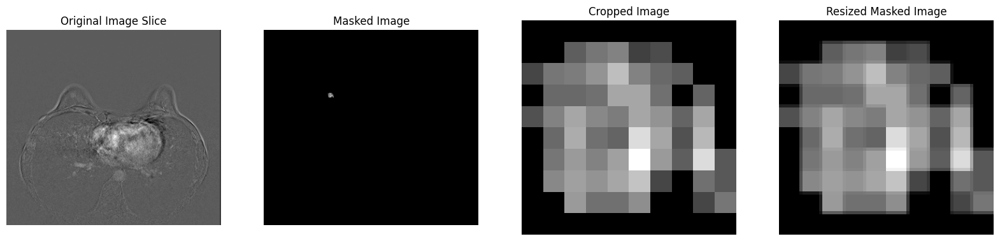

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/112.png
Mean before normalization: 159.60636169169373
Standard deviation before normalization: 32.555790051909554


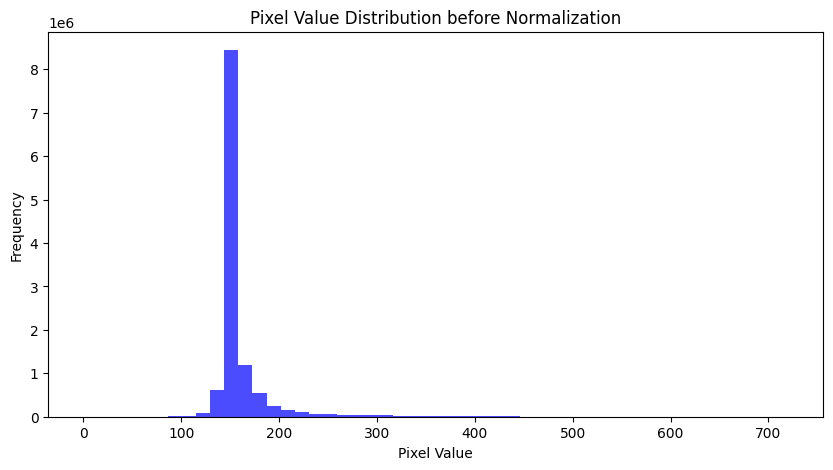

Mean after normalization: -4.552641092397442e-14
Standard deviation after normalization: 99.99999999999991


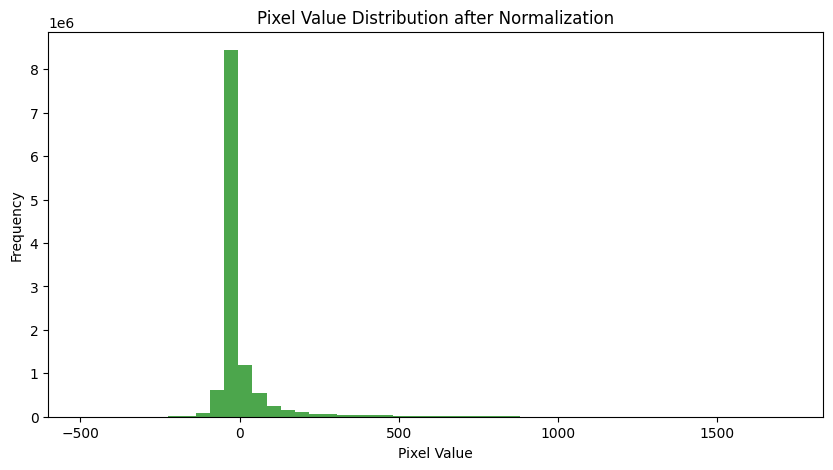

Interval where most values are located (IQR): -64.83136074424877 - 21.174845695080656


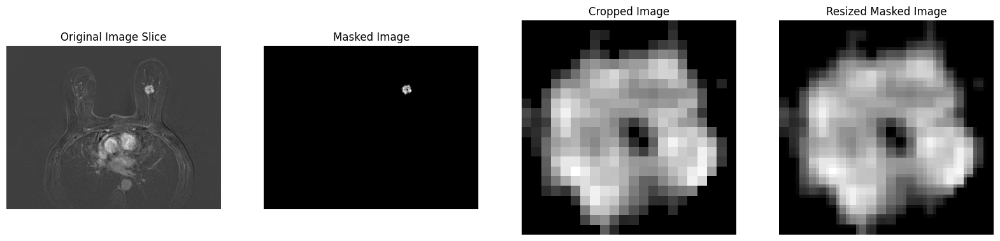

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/115.png
Mean before normalization: 156.2126591398278
Standard deviation before normalization: 22.43466736252749


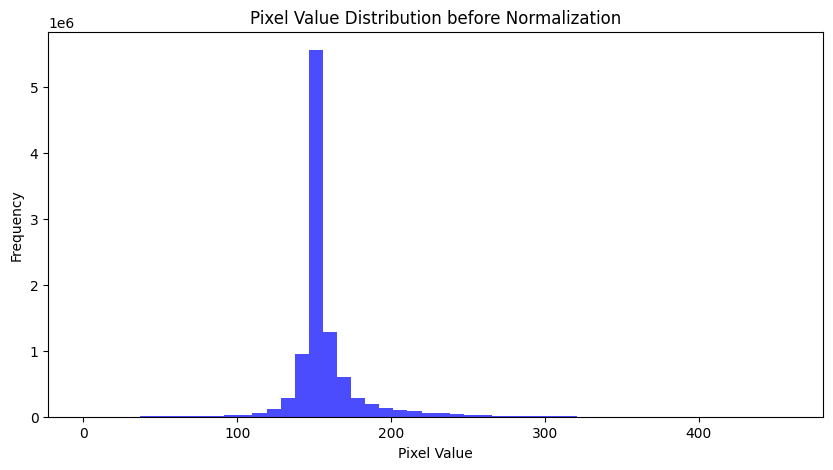

Mean after normalization: 5.361842489278666e-14
Standard deviation after normalization: 100.00000000000003


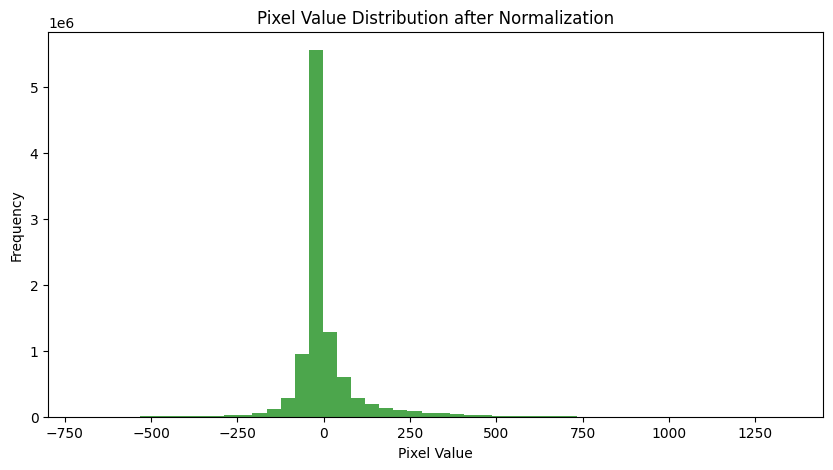

Interval where most values are located (IQR): -92.32434252367852 - 68.14159805955748


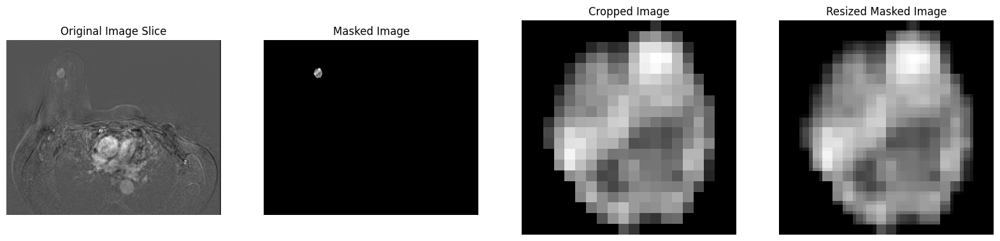

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/116.png
Mean before normalization: 156.5217033904733
Standard deviation before normalization: 24.661198627088297


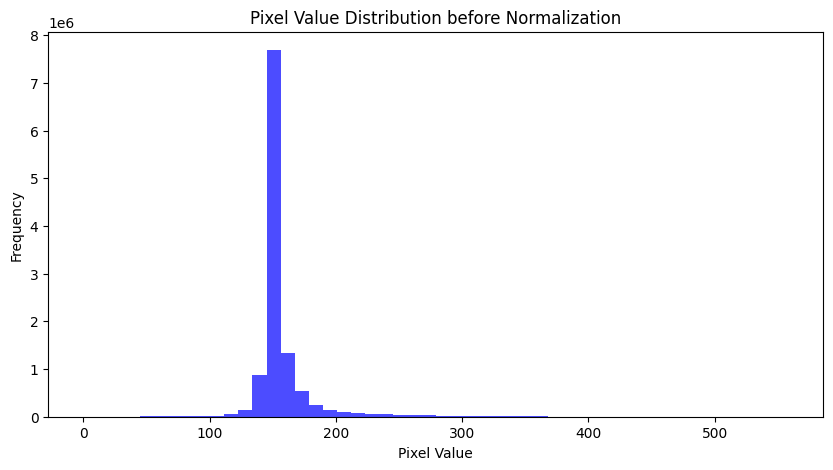

Mean after normalization: -1.8006896356469334e-14
Standard deviation after normalization: 100.00000000000004


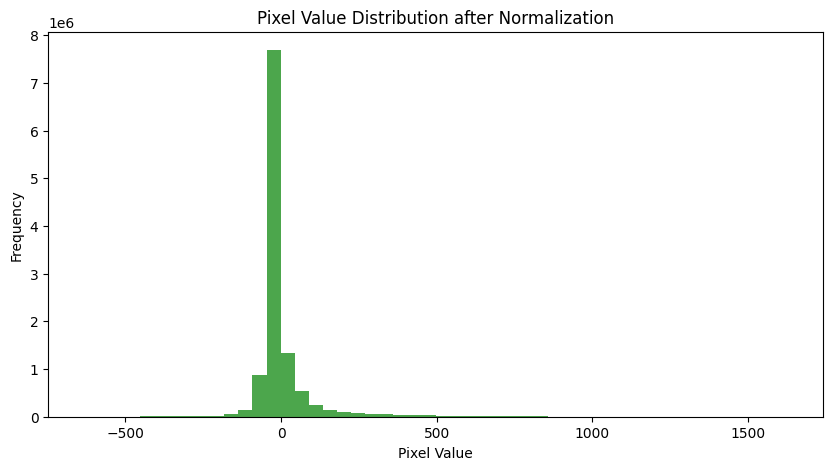

Interval where most values are located (IQR): -73.07715923701271 - 40.46152322282648


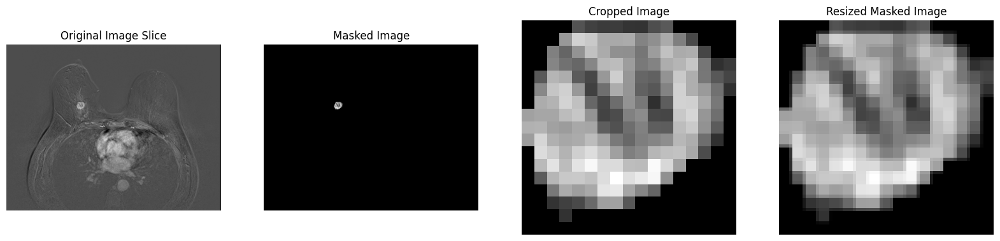

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/117.png
Mean before normalization: 160.8991196986607
Standard deviation before normalization: 34.599824377347964


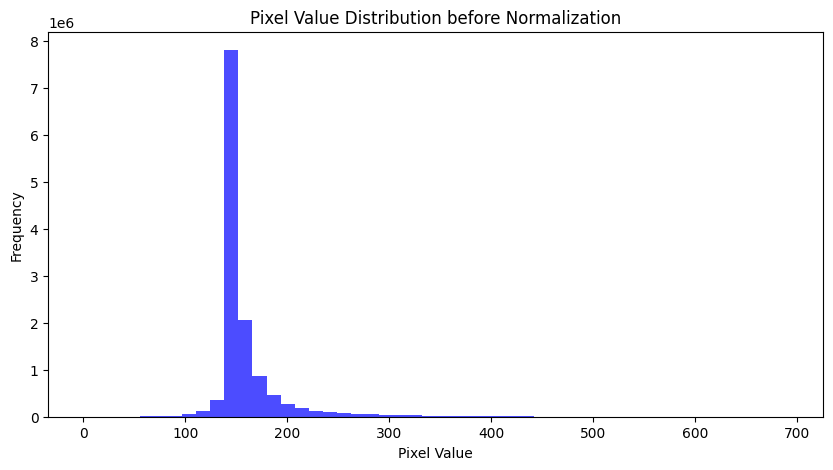

Mean after normalization: 8.535535594019743e-15
Standard deviation after normalization: 100.00000000000001


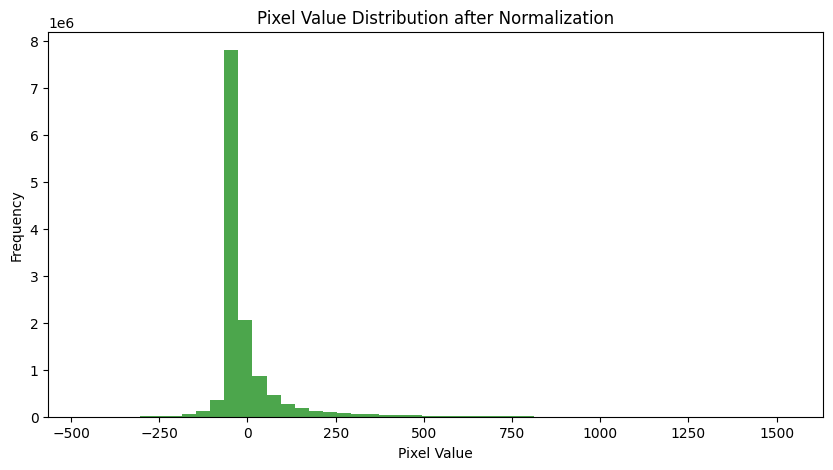

Interval where most values are located (IQR): -77.74351512683168 - 37.864008089926195


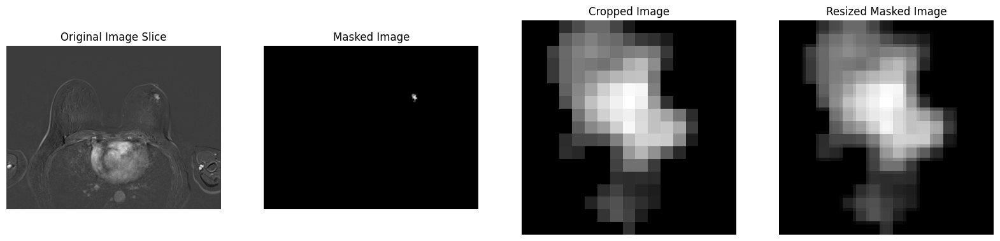

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/118.png
Mean before normalization: 161.5698359375
Standard deviation before normalization: 30.745513113702753


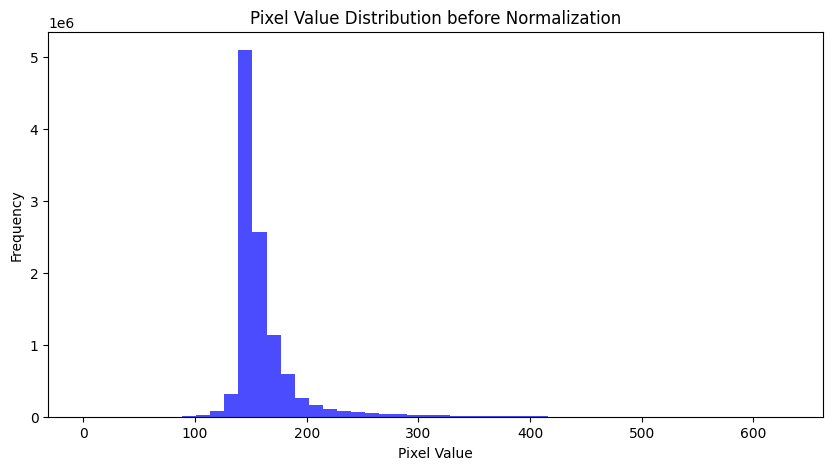

Mean after normalization: 3.295564879192084e-14
Standard deviation after normalization: 99.99999999999997


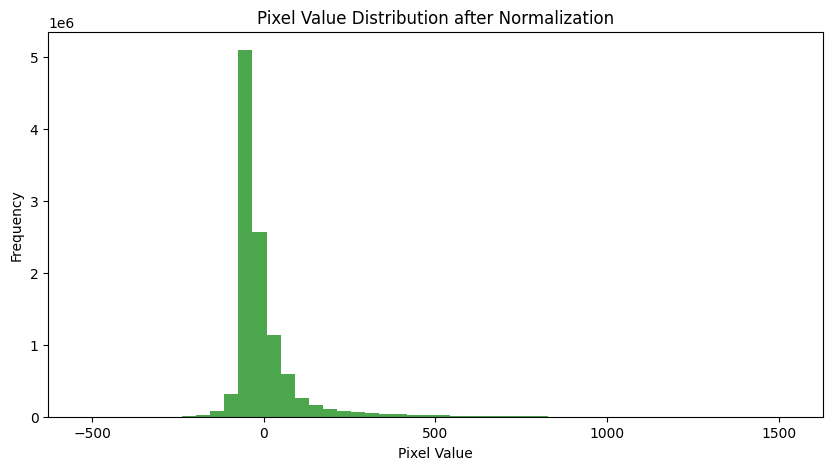

Interval where most values are located (IQR): -114.0648907299256 - 81.08553586438296


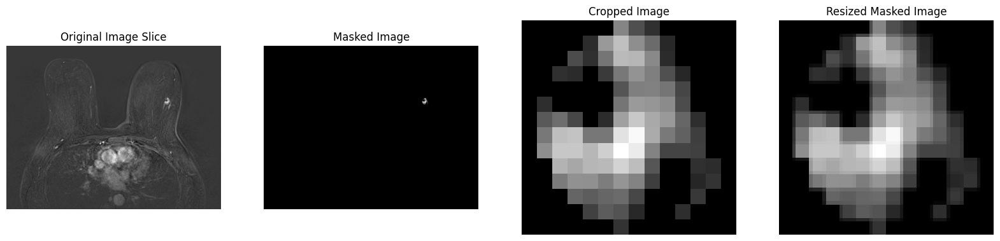

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/119.png
Mean before normalization: 163.825066015625
Standard deviation before normalization: 37.55917216507989


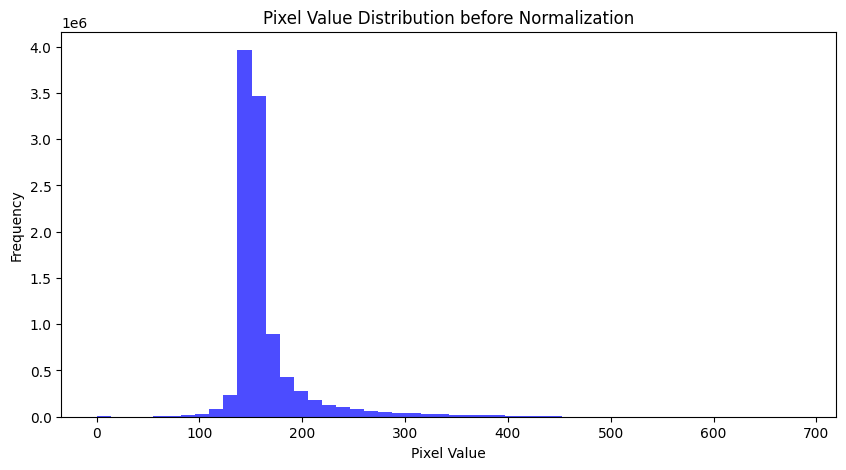

Mean after normalization: -5.022116056352388e-15
Standard deviation after normalization: 99.9999999999999


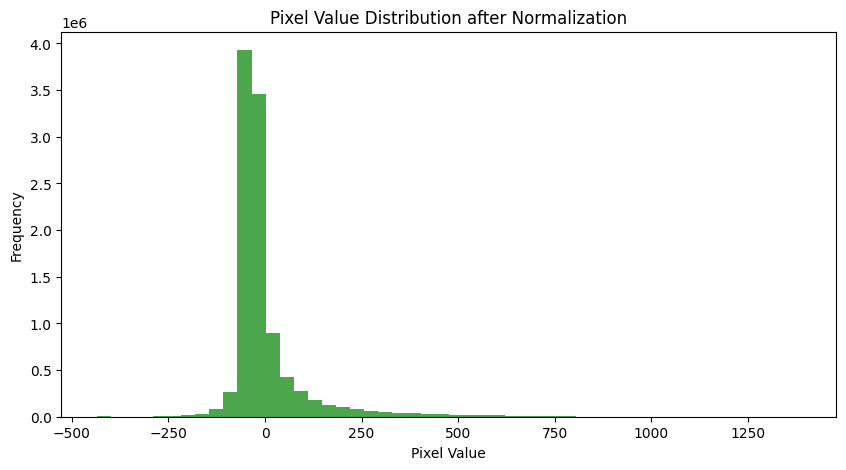

Interval where most values are located (IQR): -95.3830022082671 - 53.71506564548928


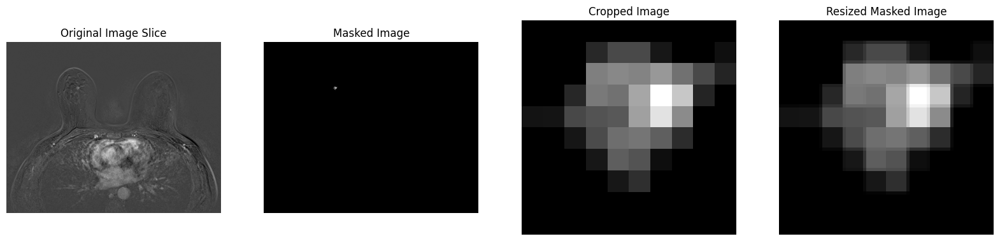

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/120.png
Mean before normalization: 162.73899576822916
Standard deviation before normalization: 25.265014103763992


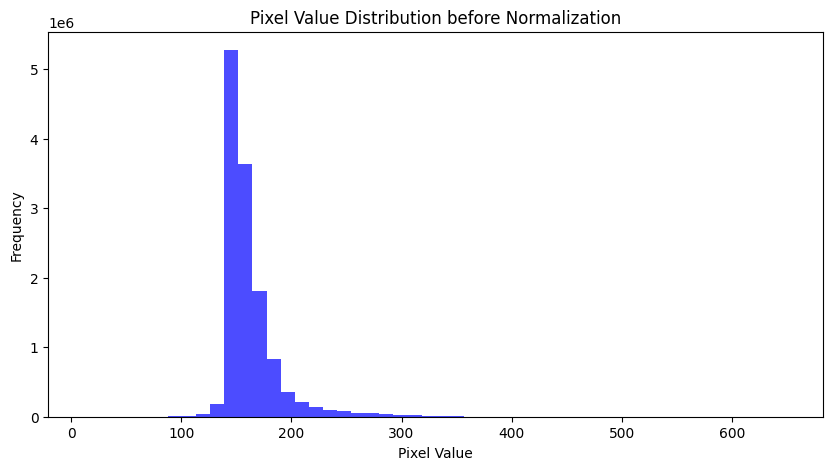

Mean after normalization: 3.23195438665737e-14
Standard deviation after normalization: 100.00000000000007


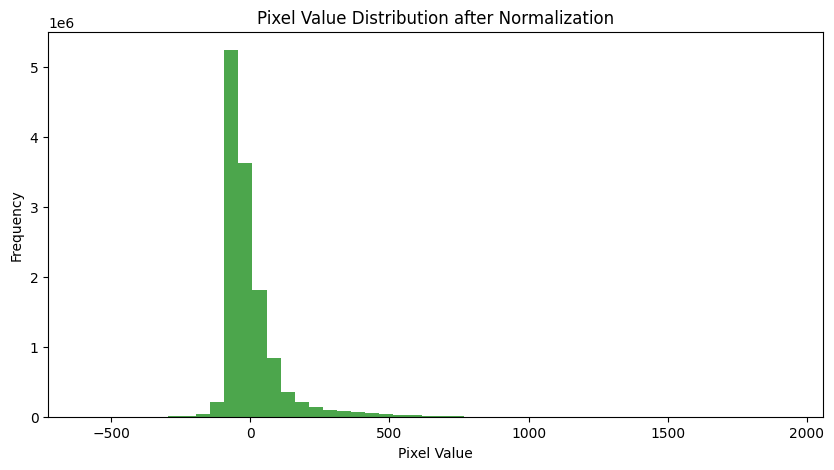

Interval where most values are located (IQR): -151.35157103487347 - 117.79532007994024
Error processing 123.nrrd: Image slice and mask slice shapes do not match
Mean before normalization: 56.16756932642553
Standard deviation before normalization: 19.654127388360315


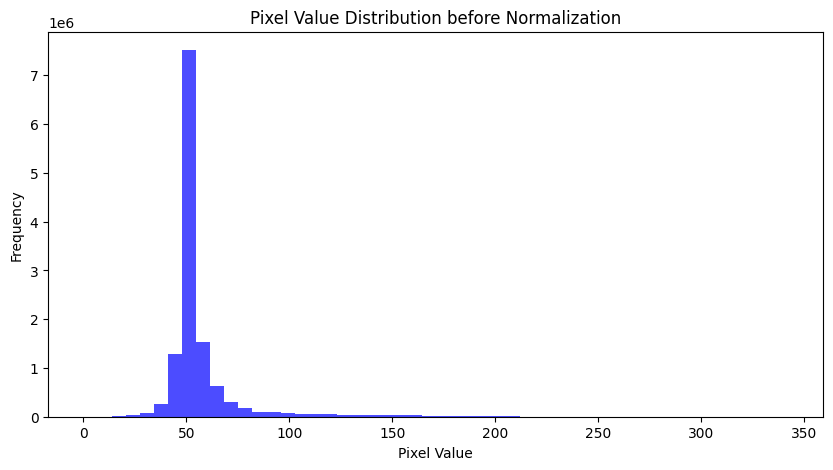

Mean after normalization: -2.3715517284460487e-15
Standard deviation after normalization: 100.00000000000009


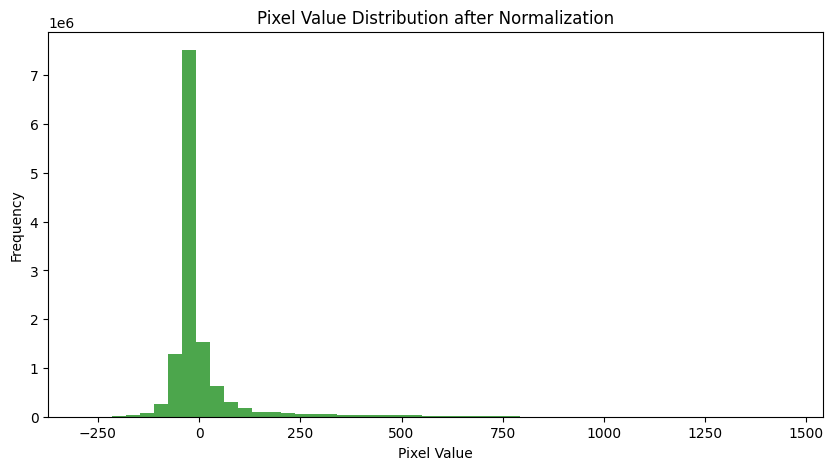

Interval where most values are located (IQR): -82.26042808697976 - 39.85132750392694


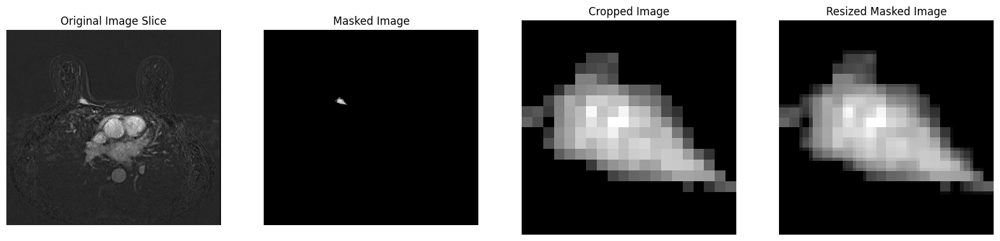

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/129.png
Mean before normalization: 156.48694289434525
Standard deviation before normalization: 24.429993578911457


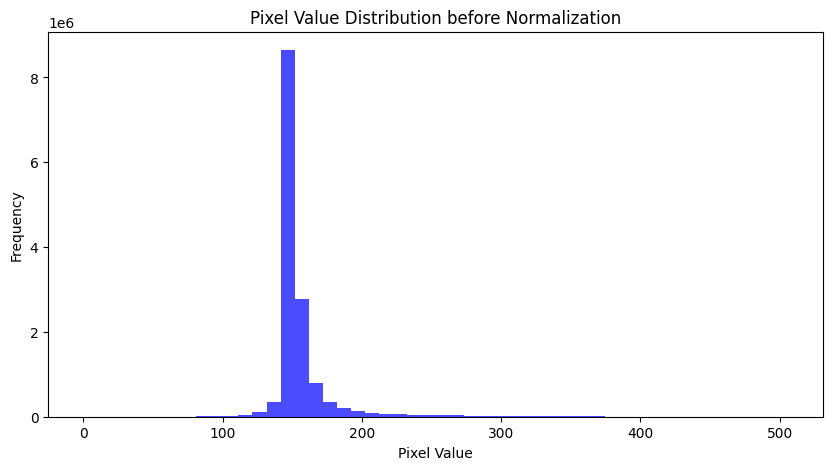

Mean after normalization: -3.7219946294738965e-14
Standard deviation after normalization: 100.00000000000001


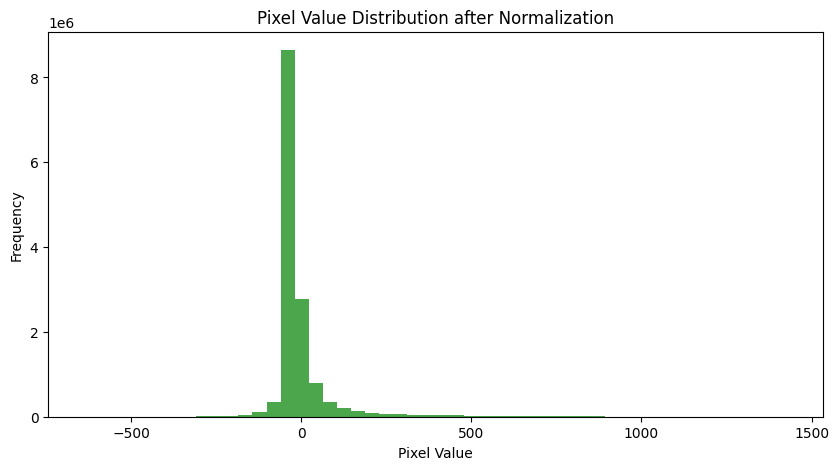

Interval where most values are located (IQR): -61.34648724296976 - 20.52009178578803


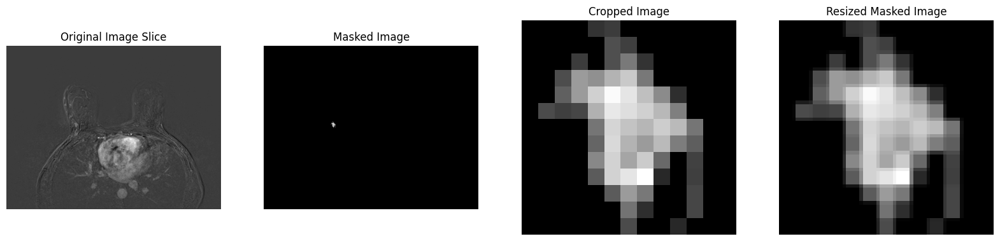

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/131.png
Mean before normalization: 54.249420429830586
Standard deviation before normalization: 15.676085894010495


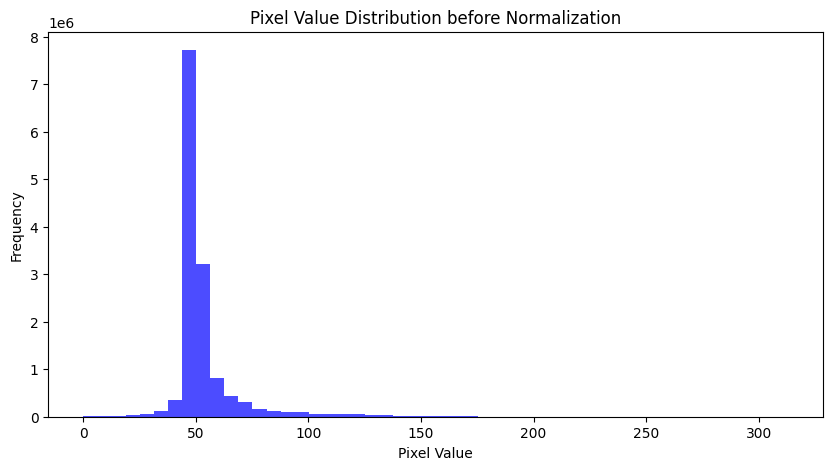

Mean after normalization: -5.627602576045746e-15
Standard deviation after normalization: 99.99999999999999


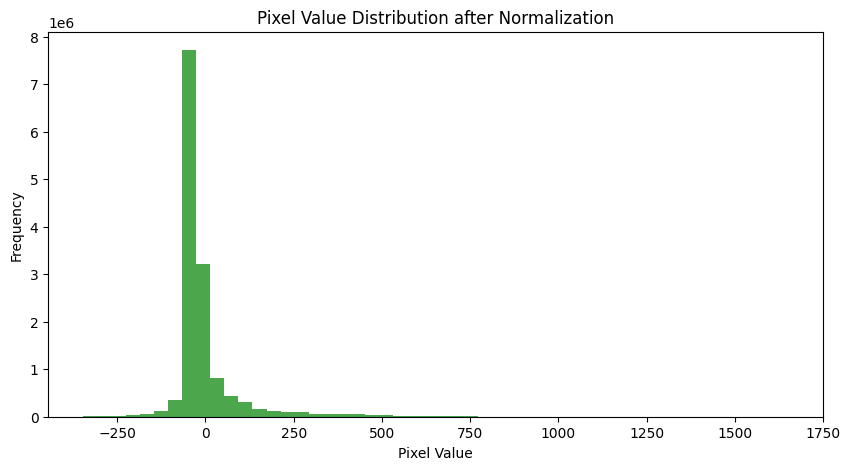

Interval where most values are located (IQR): -71.7616661830665 - 30.30462835103826


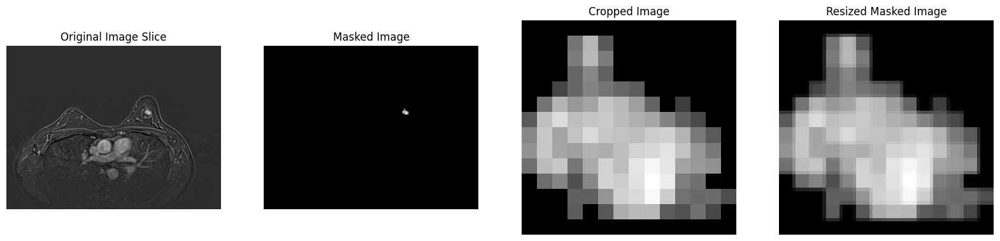

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/100a.png
Mean before normalization: 54.249420429830586
Standard deviation before normalization: 15.676085894010495


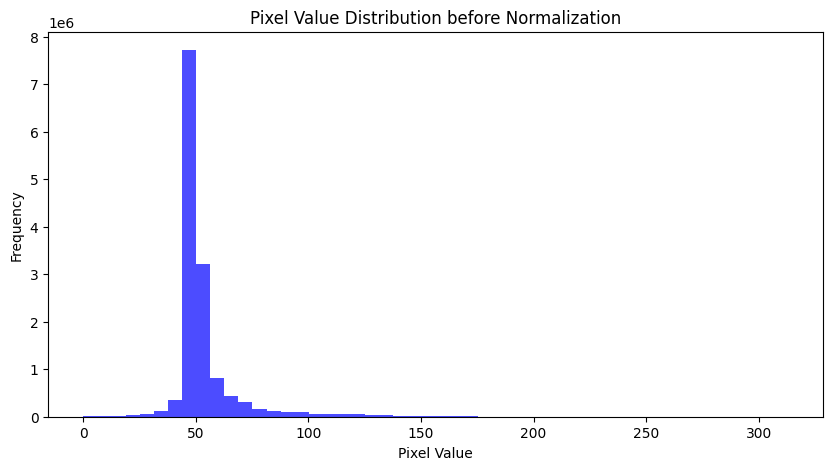

Mean after normalization: -5.627602576045746e-15
Standard deviation after normalization: 99.99999999999999


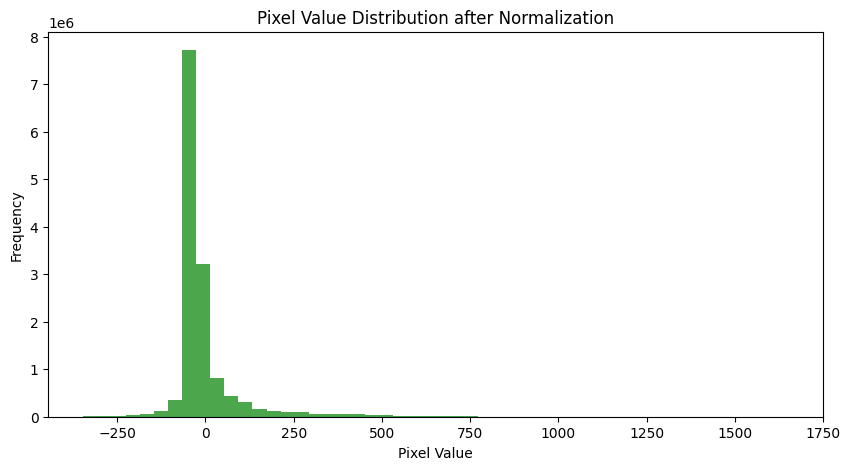

Interval where most values are located (IQR): -71.7616661830665 - 30.30462835103826


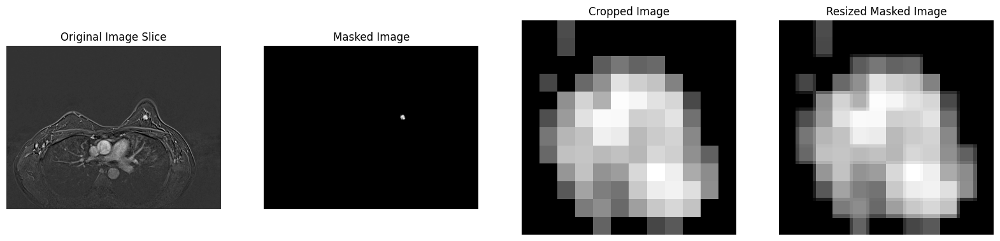

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/100b.png
Mean before normalization: 4.510261310741744
Standard deviation before normalization: 15.923040494651206


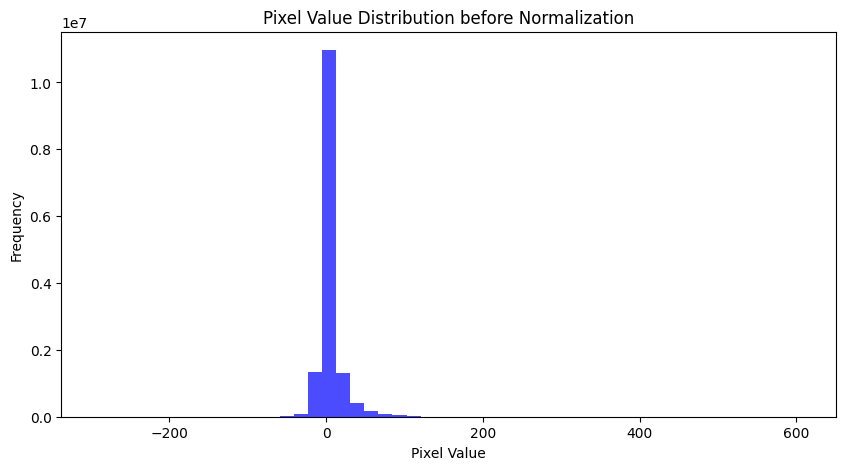

Mean after normalization: 6.833536004631576e-15
Standard deviation after normalization: 100.00000000000006


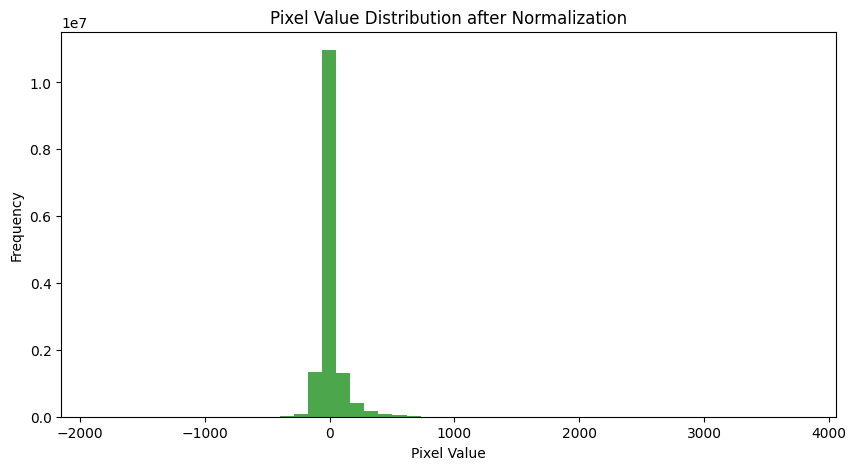

Interval where most values are located (IQR): -116.24828384352617 - 84.7183594979217


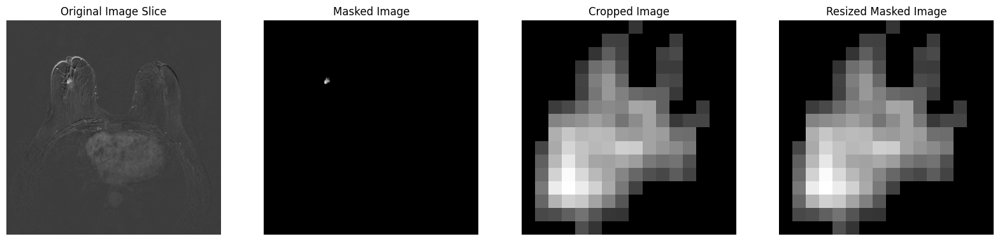

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/125.png
Mean before normalization: 54.87165414315683
Standard deviation before normalization: 13.026522656601852


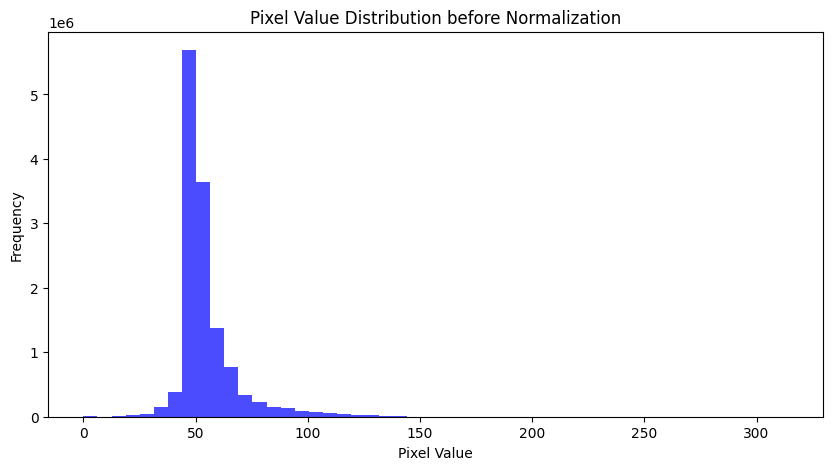

Mean after normalization: -3.80578970258666e-14
Standard deviation after normalization: 99.99999999999991


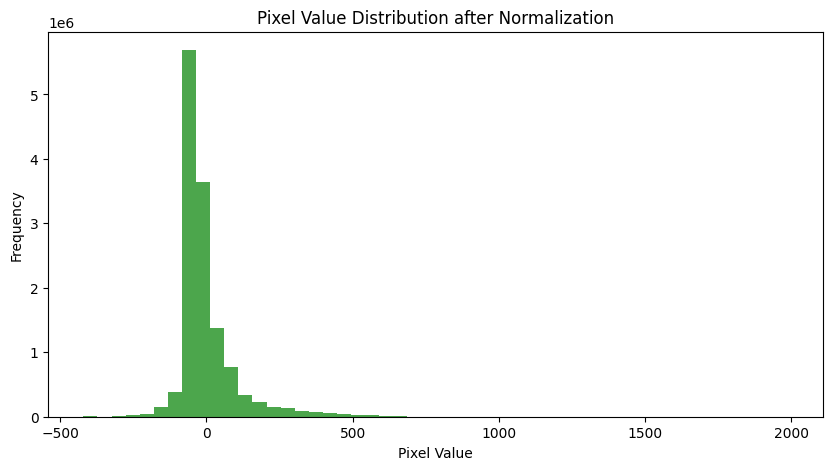

Interval where most values are located (IQR): -137.19435811290333 - 108.45830640522405


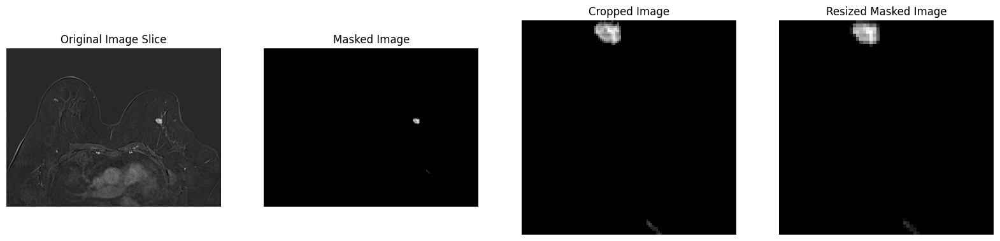

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/noMETA/126.png

Processing images in META folder...
Mean before normalization: 158.34994664236433
Standard deviation before normalization: 25.659649254673443


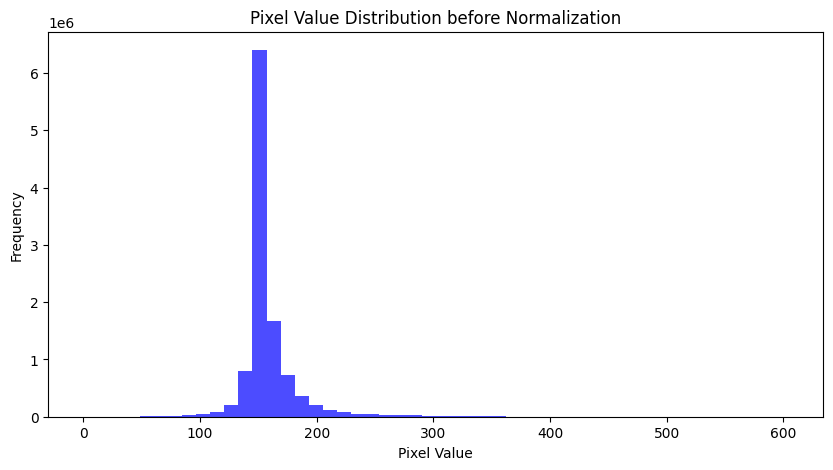

Mean after normalization: 1.509408965575723e-14
Standard deviation after normalization: 99.99999999999994


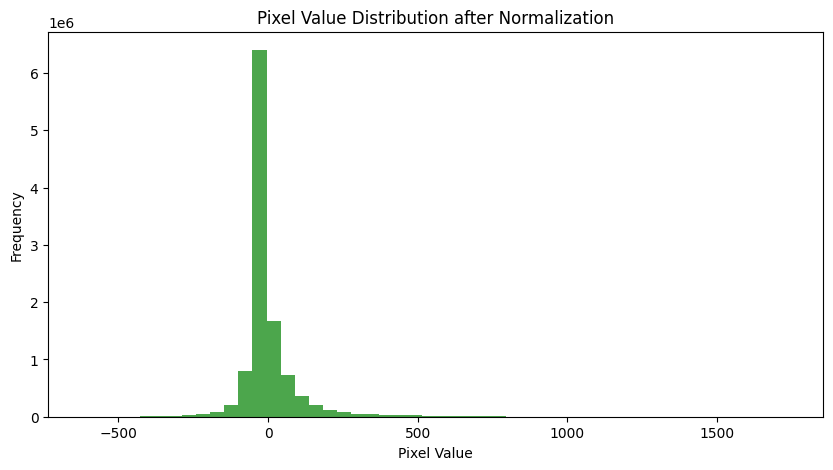

Interval where most values are located (IQR): -106.58737526345193 - 80.47675614223229


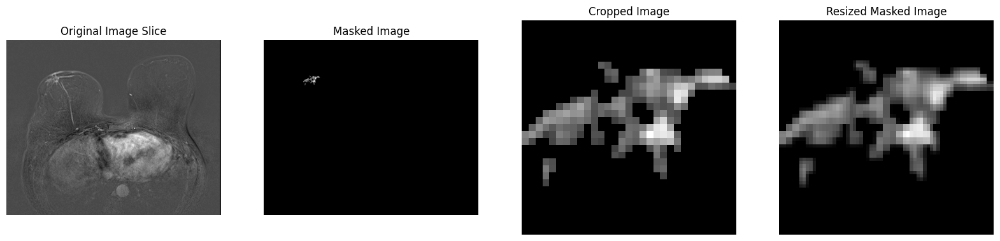

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/124.png
Mean before normalization: 161.44073059752748
Standard deviation before normalization: 28.419653809601908


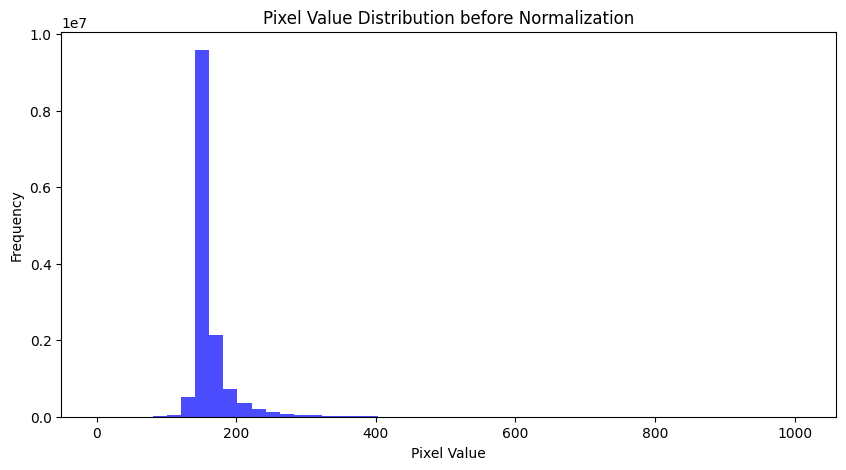

Mean after normalization: -8.107995349596571e-15
Standard deviation after normalization: 99.99999999999991


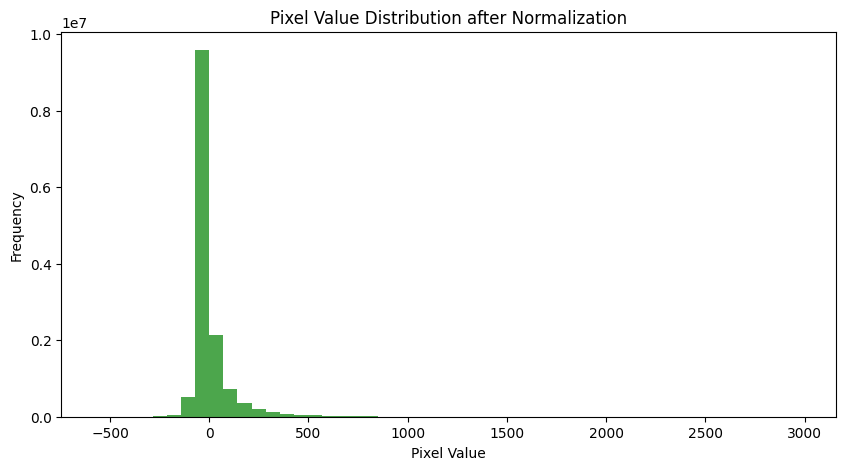

Interval where most values are located (IQR): -108.87089197080155 - 74.10107647179505


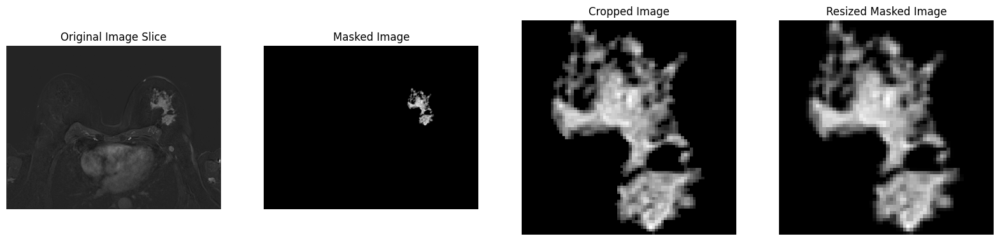

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/127.png
Mean before normalization: 160.03395369042366
Standard deviation before normalization: 25.94120300088694


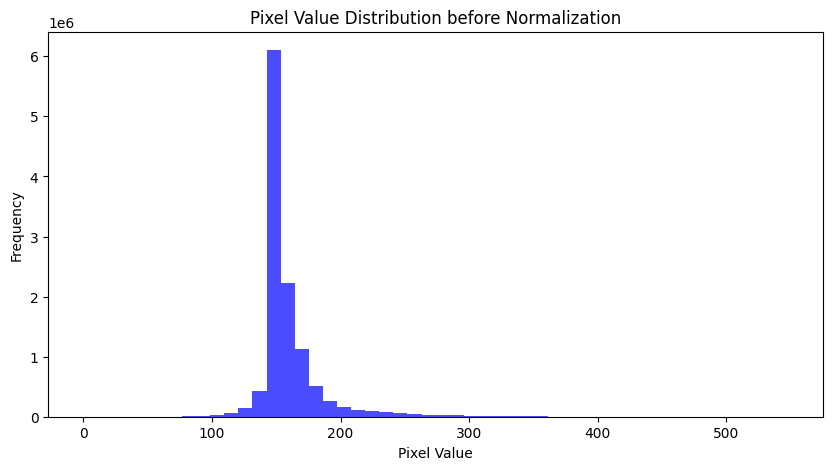

Mean after normalization: -1.794606436585263e-14
Standard deviation after normalization: 100.00000000000004


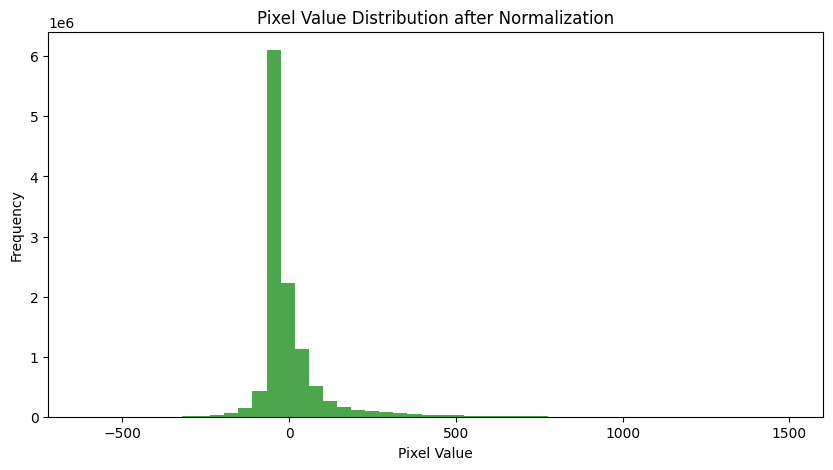

Interval where most values are located (IQR): -113.84959166856635 - 86.60371806507285


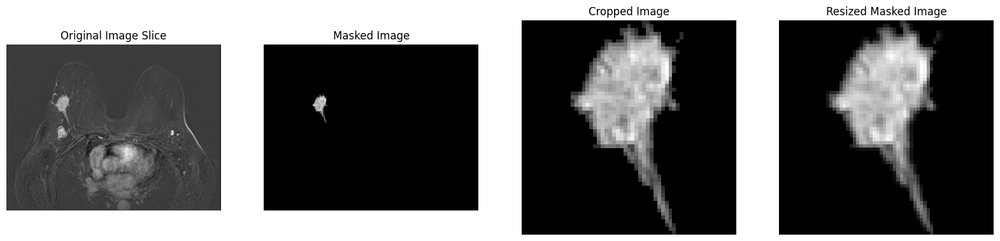

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/158.png
Mean before normalization: 160.60703748497596
Standard deviation before normalization: 34.18180202976504


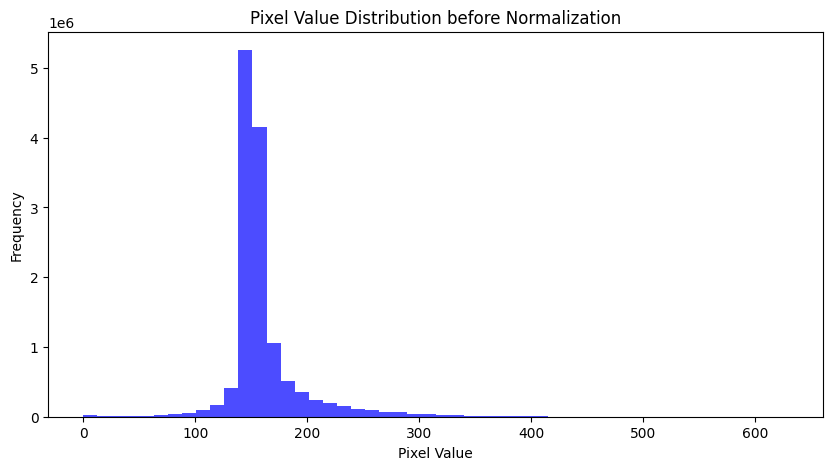

Mean after normalization: -3.454330838464487e-15
Standard deviation after normalization: 100.00000000000001


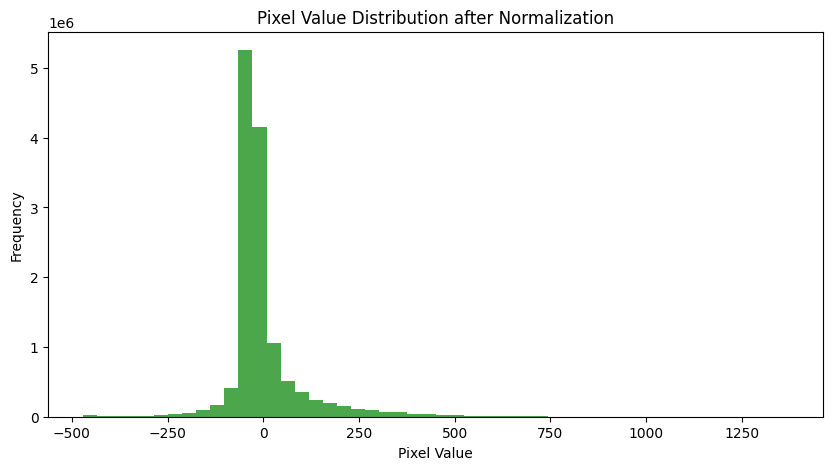

Interval where most values are located (IQR): -79.30254075361951 - 49.42092432784521


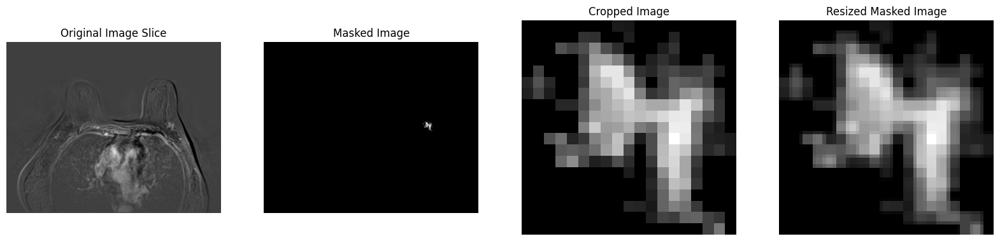

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/18.png
Mean before normalization: 161.33450575422
Standard deviation before normalization: 31.907654323914596


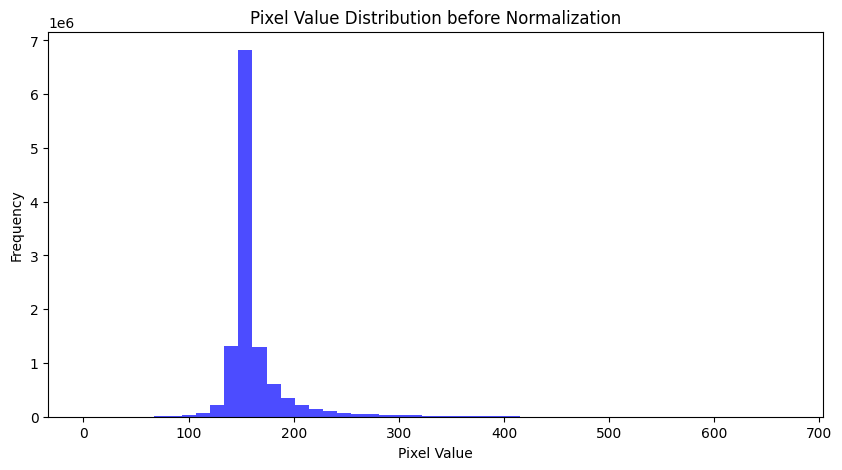

Mean after normalization: -3.2544487846014685e-14
Standard deviation after normalization: 99.99999999999999


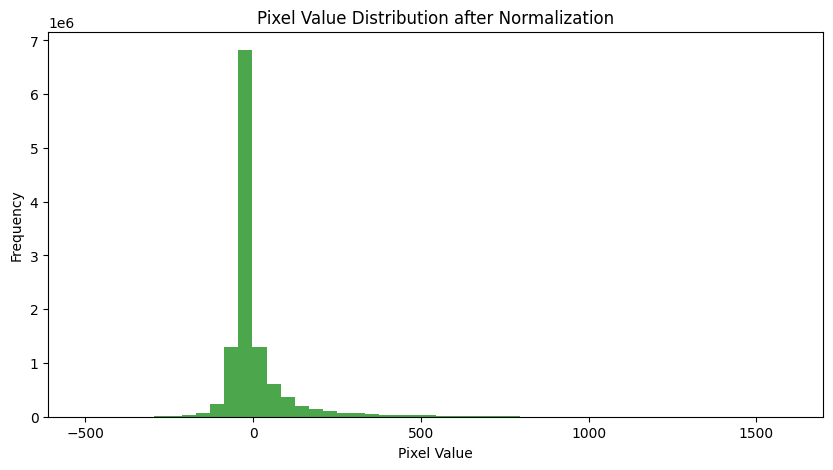

Interval where most values are located (IQR): -99.77074914704787 - 63.199550932410844


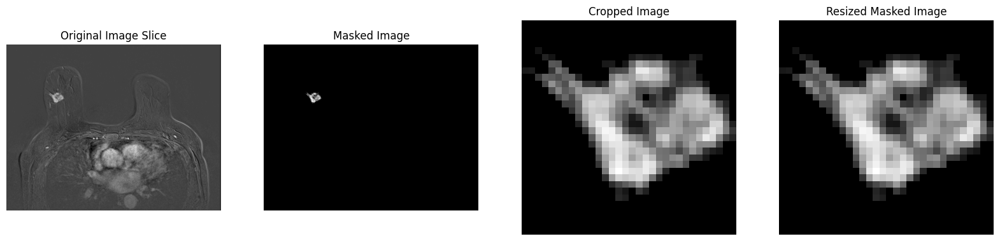

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/31.png
Mean before normalization: 157.14493900240385
Standard deviation before normalization: 23.153714271636883


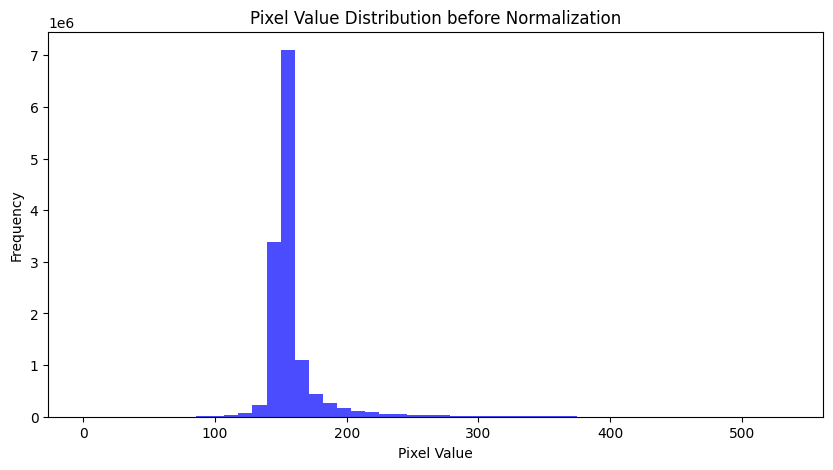

Mean after normalization: 2.3218350319299273e-15
Standard deviation after normalization: 100.0


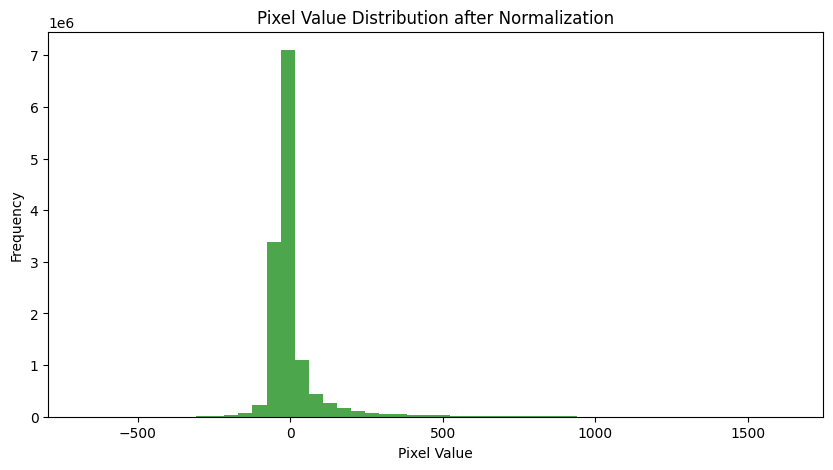

Interval where most values are located (IQR): -80.52677330152488 - 40.40414806818287


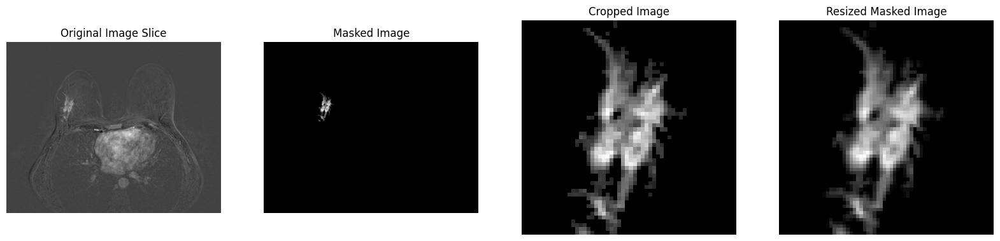

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/33.png
Mean before normalization: 157.09694869686234
Standard deviation before normalization: 21.959115776298855


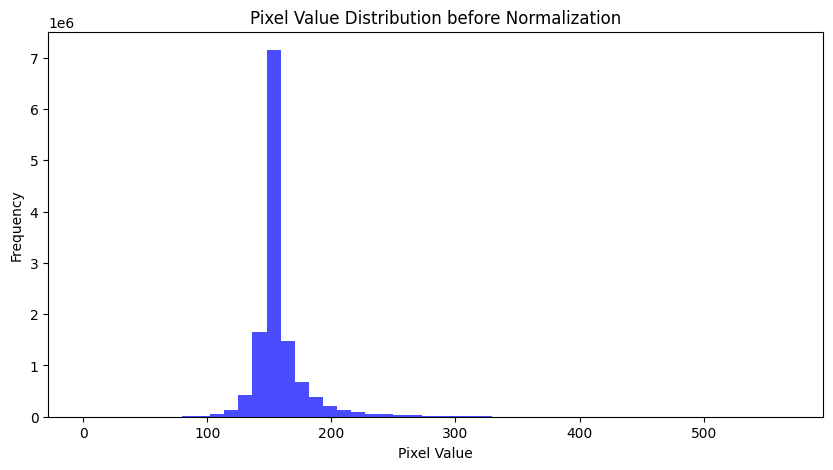

Mean after normalization: 3.4529500266702974e-14
Standard deviation after normalization: 100.00000000000006


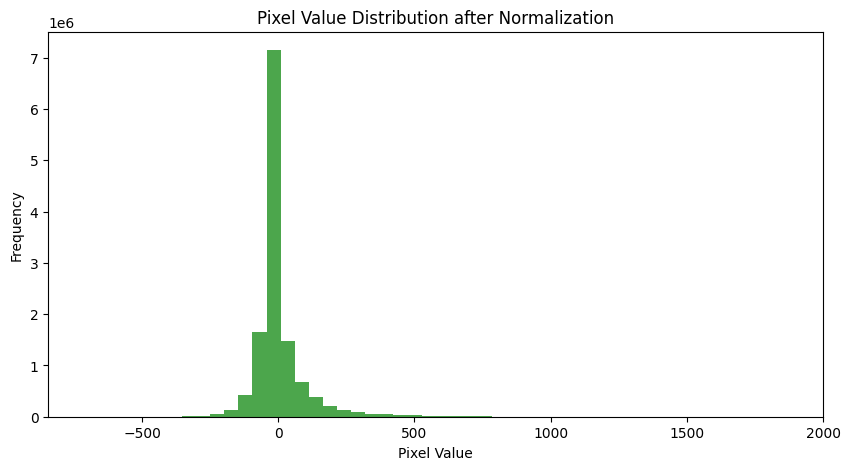

Interval where most values are located (IQR): -112.01247330464273 - 88.35989345290473


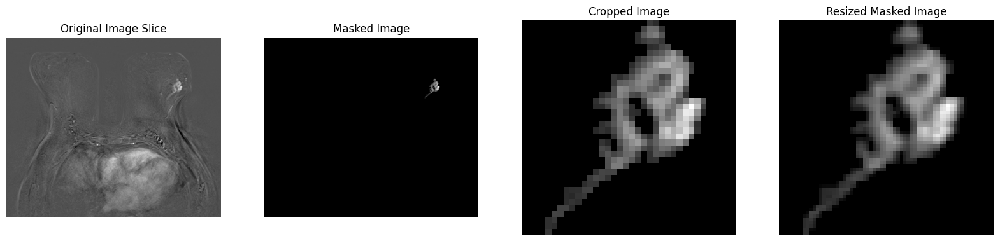

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/41.png
Mean before normalization: 157.85117647147473
Standard deviation before normalization: 24.238292406919463


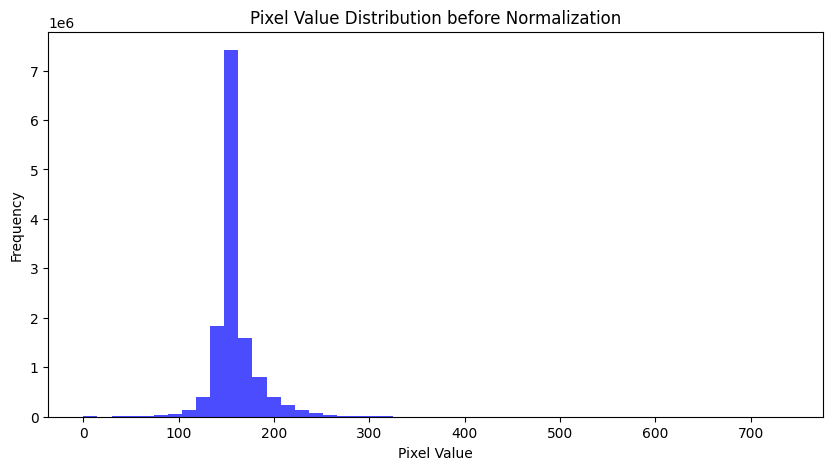

Mean after normalization: -4.406900084907164e-15
Standard deviation after normalization: 99.99999999999996


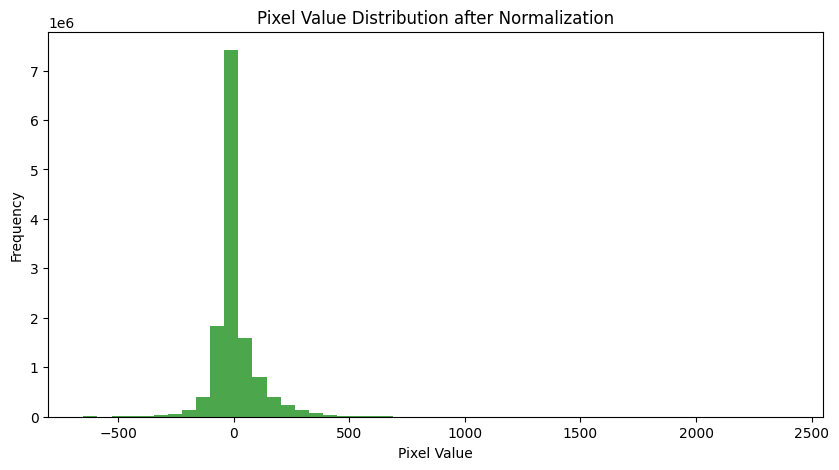

Interval where most values are located (IQR): -123.15709361998174 - 107.88228431909005


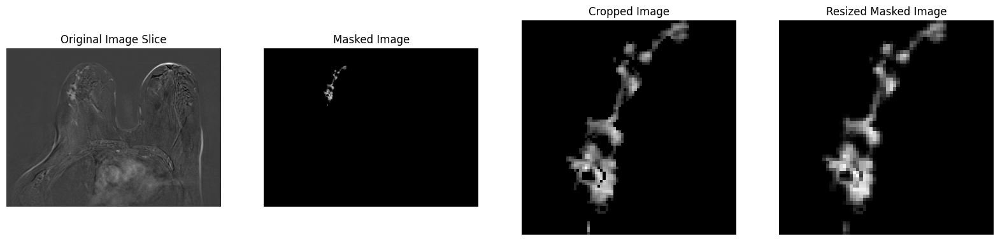

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/87.png
Mean before normalization: 2.084125363096899
Standard deviation before normalization: 11.08846547771554


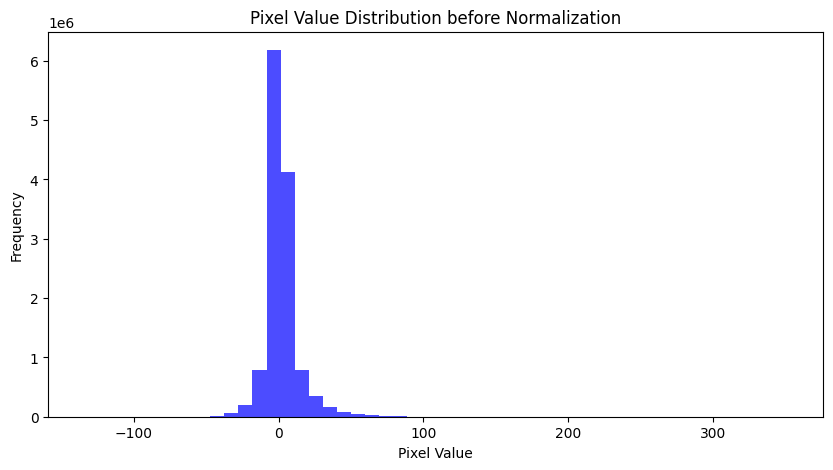

Mean after normalization: 5.6462770966650815e-15
Standard deviation after normalization: 99.99999999999996


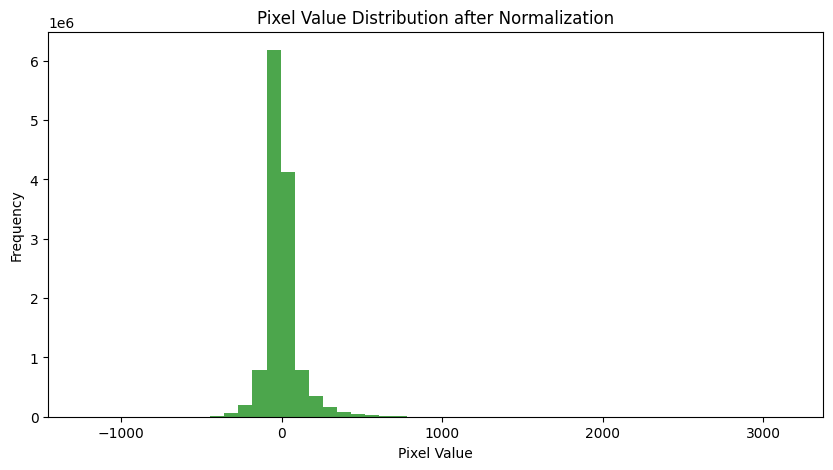

Interval where most values are located (IQR): -154.07114174121588 - 134.51703183708779


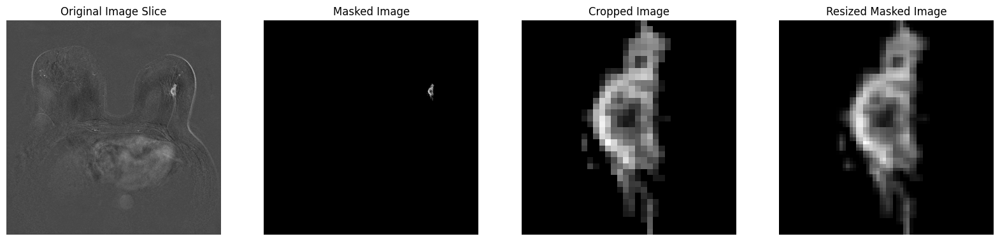

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/99.png
Mean before normalization: 57.89158467834249
Standard deviation before normalization: 18.66696059179092


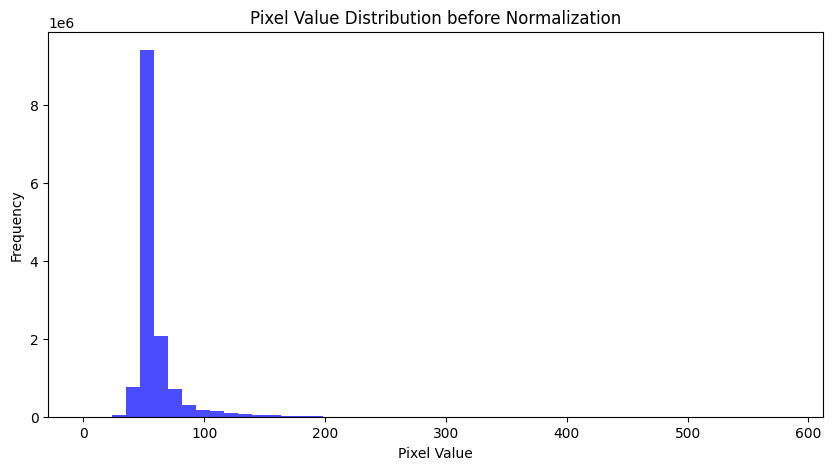

Mean after normalization: 1.1947528843344922e-14
Standard deviation after normalization: 99.9999999999999


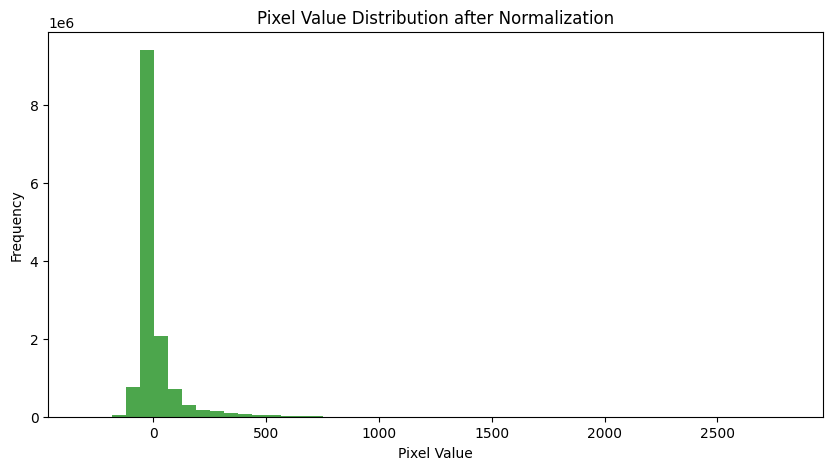

Interval where most values are located (IQR): -114.59597063567898 - 78.25813554286809


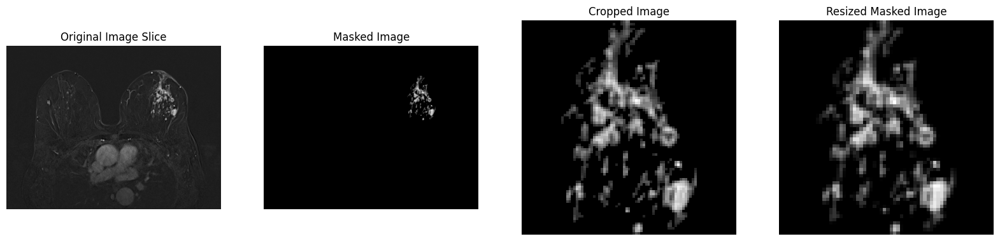

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/165.png
Mean before normalization: 159.20969235944975
Standard deviation before normalization: 29.885353429628207


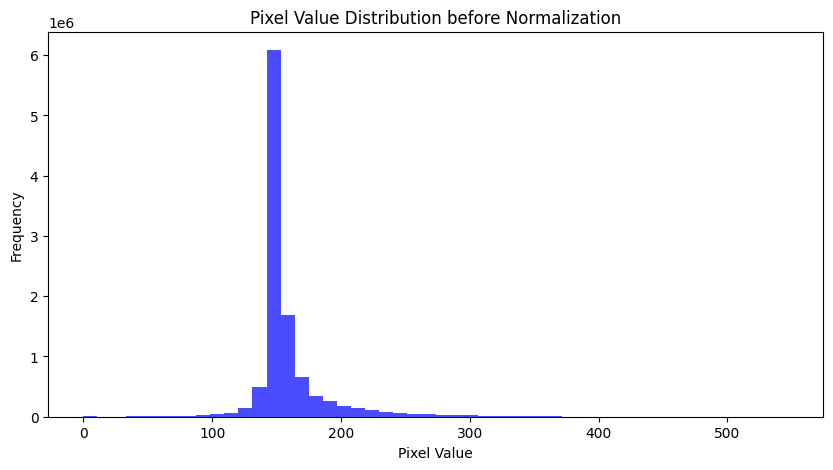

Mean after normalization: 3.71610451076524e-14
Standard deviation after normalization: 99.99999999999999


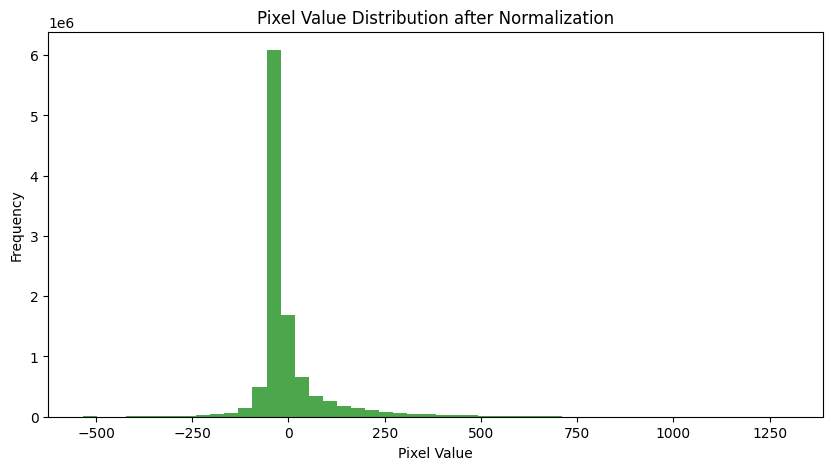

Interval where most values are located (IQR): -84.35467366585323 - 49.49015468522855


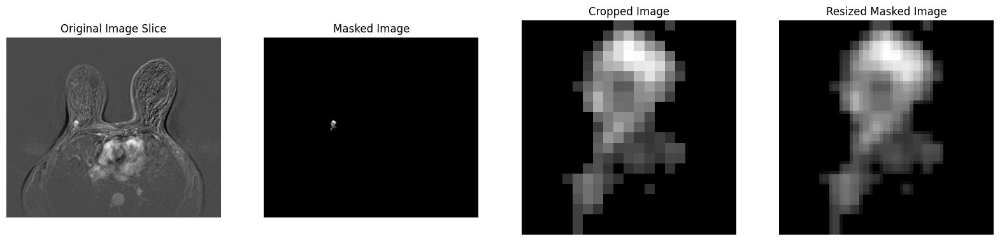

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/169.png
Mean before normalization: 55.46777491009425
Standard deviation before normalization: 13.718158261533192


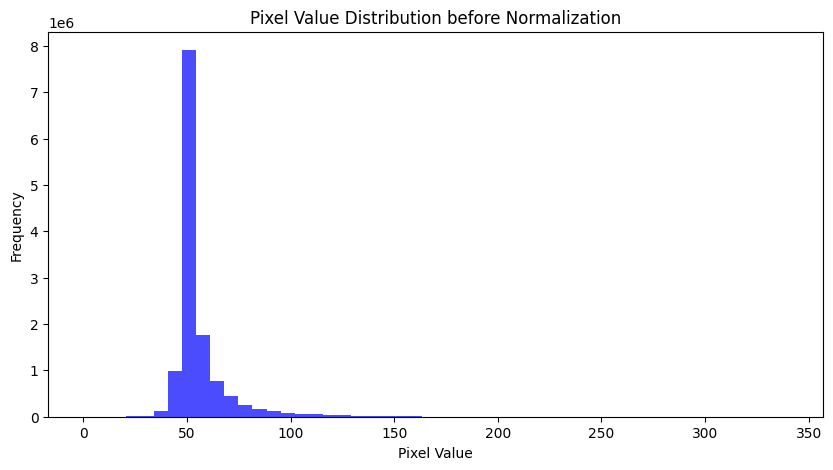

Mean after normalization: -1.9507217710645545e-14
Standard deviation after normalization: 99.99999999999996


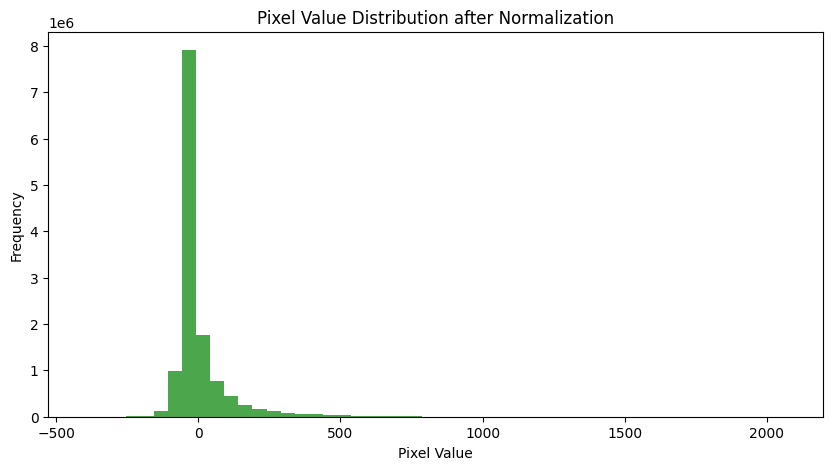

Interval where most values are located (IQR): -134.62284483099572 - 98.64462001325052


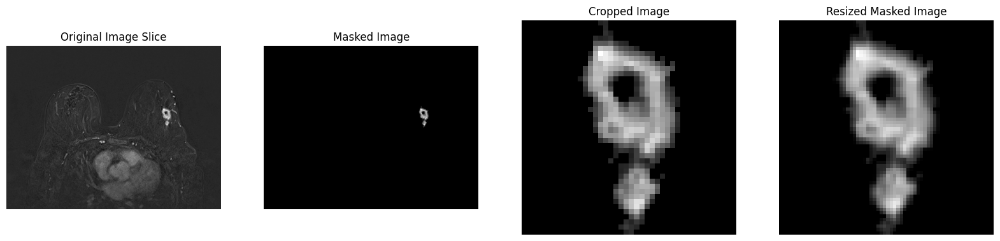

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/181.png
Mean before normalization: 155.86170534264843
Standard deviation before normalization: 24.381810856308373


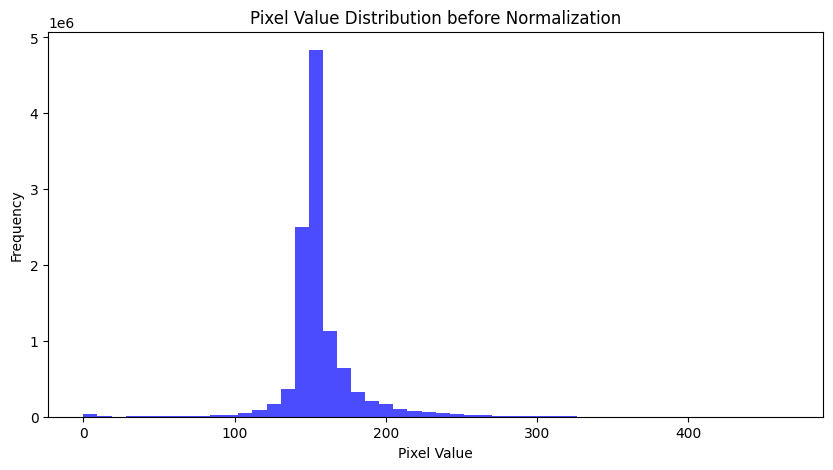

Mean after normalization: -5.097979346440556e-14
Standard deviation after normalization: 99.99999999999994


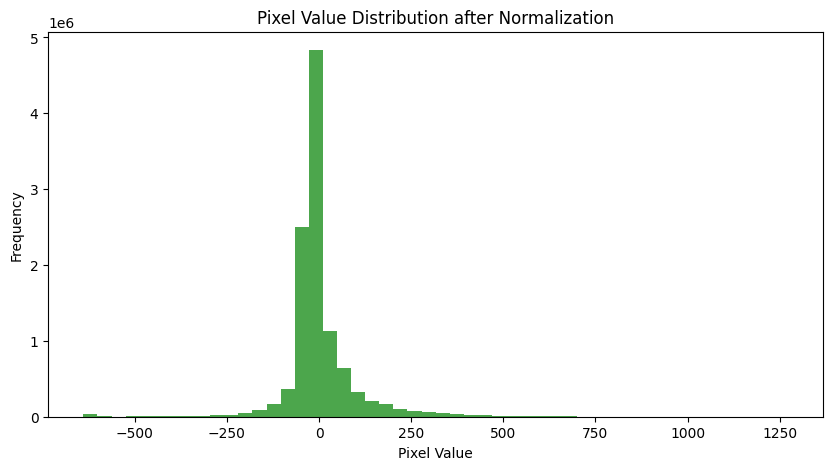

Interval where most values are located (IQR): -89.66399366924828 - 74.39272974533223


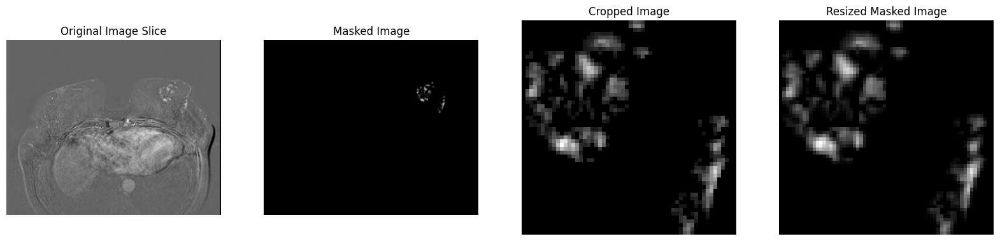

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/190.png
Mean before normalization: 2.570538440799497
Standard deviation before normalization: 8.769092834180412


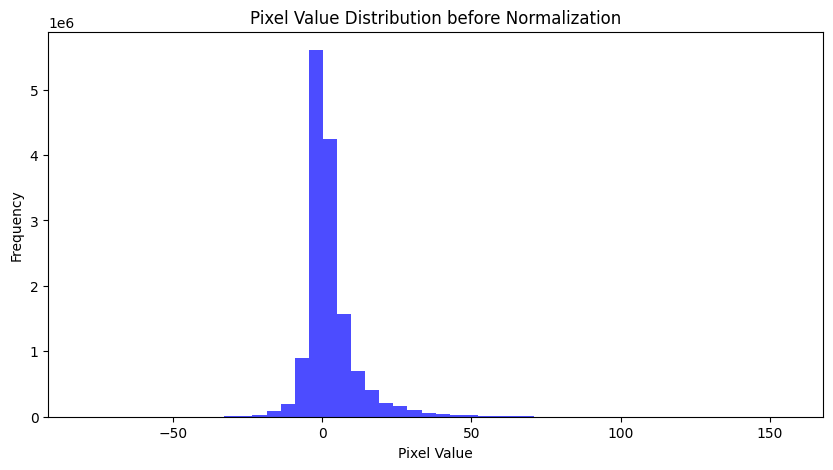

Mean after normalization: -2.549736687846618e-15
Standard deviation after normalization: 100.00000000000007


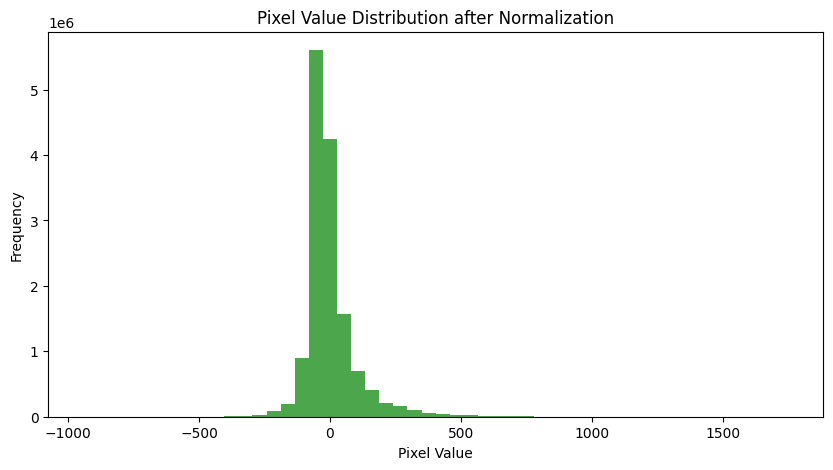

Interval where most values are located (IQR): -126.24496798173291 - 101.8287949284218


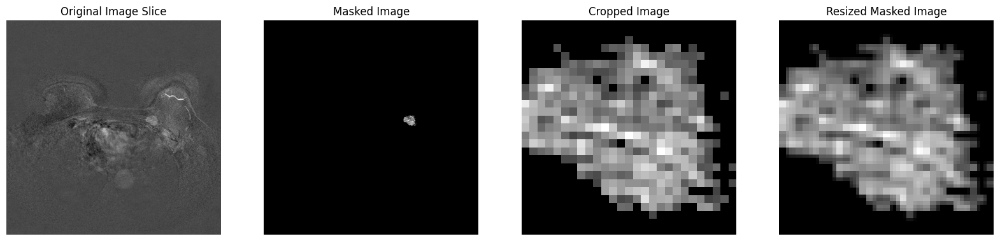

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/200.png
Mean before normalization: 2.0930496826171874
Standard deviation before normalization: 8.28359690115488


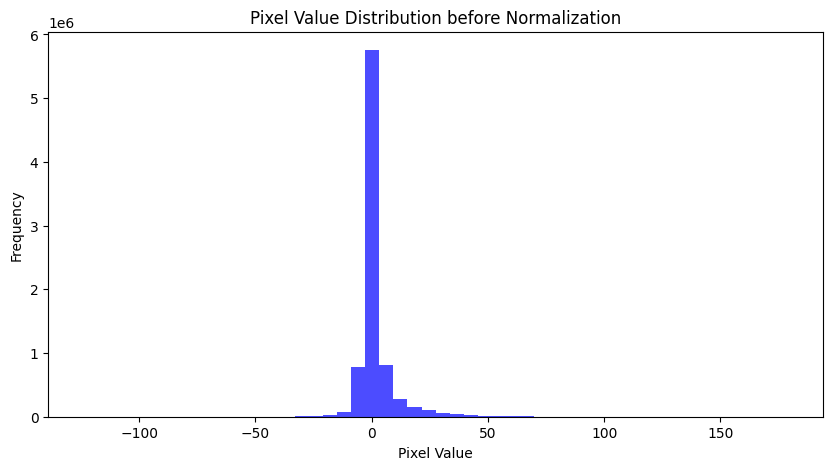

Mean after normalization: -2.948752353404416e-16
Standard deviation after normalization: 99.99999999999996


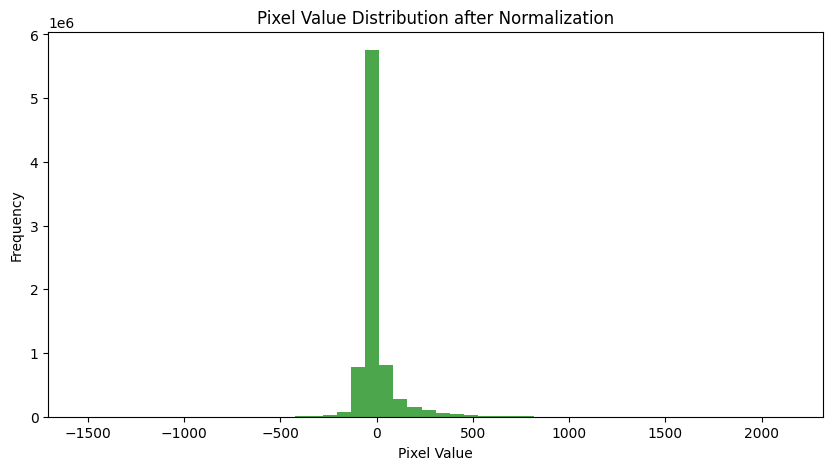

Interval where most values are located (IQR): -91.66367911454722 - 53.20092672264635


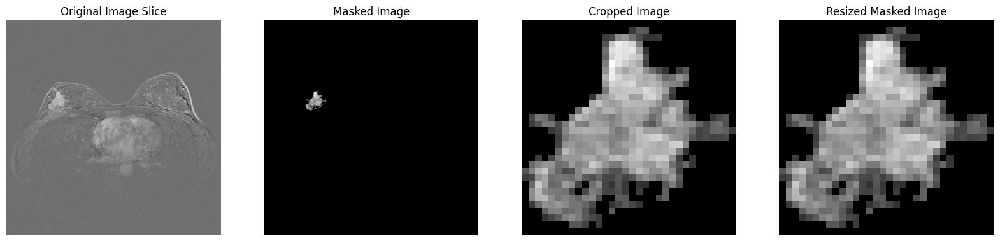

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/207.png
Mean before normalization: 55.629307972301135
Standard deviation before normalization: 19.387741126875223


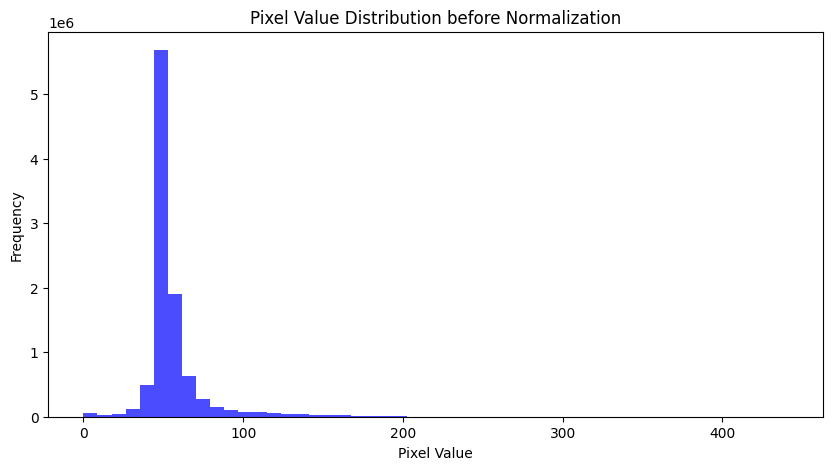

Mean after normalization: 9.601135313783172e-15
Standard deviation after normalization: 99.99999999999999


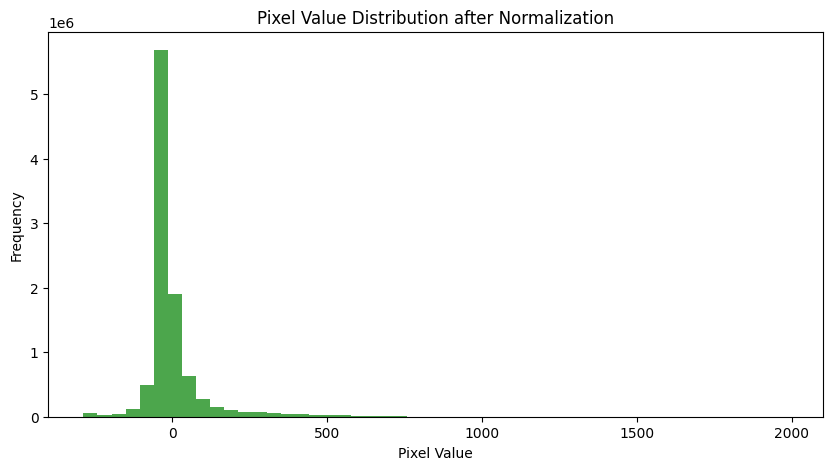

Interval where most values are located (IQR): -88.35123112179656 - 56.06992561206601


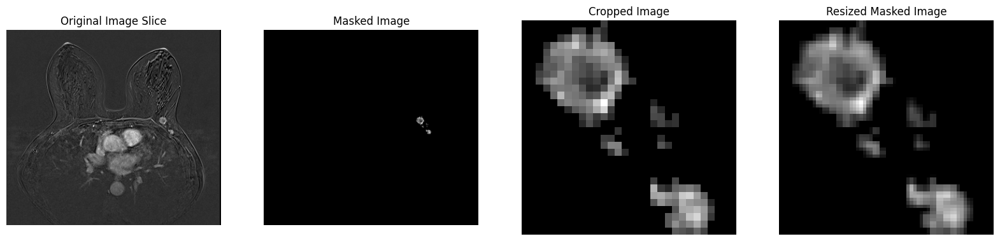

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/208.png
Mean before normalization: 158.4748766161294
Standard deviation before normalization: 21.40885469772082


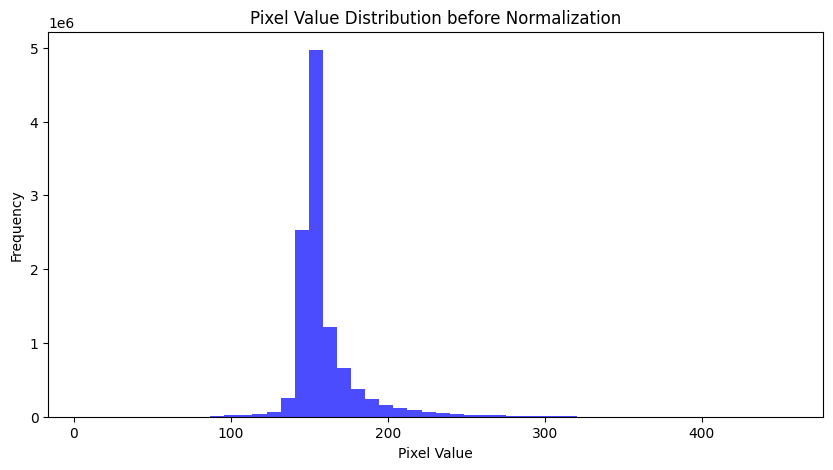

Mean after normalization: 5.382460092965657e-14
Standard deviation after normalization: 99.99999999999994


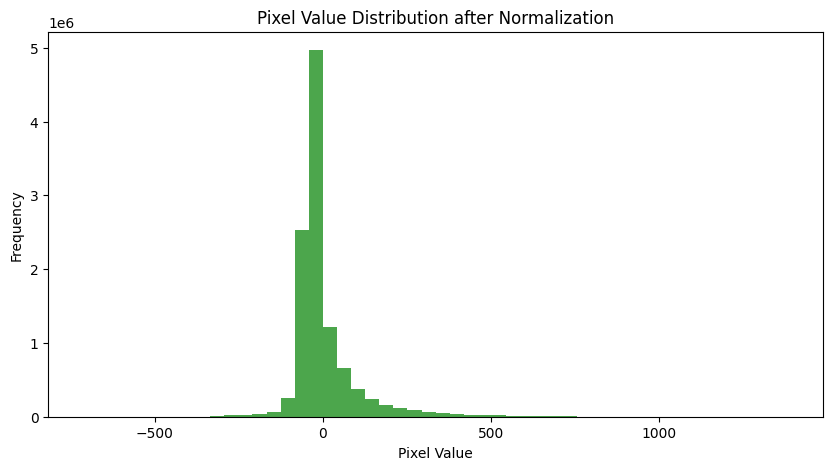

Interval where most values are located (IQR): -128.33417295813754 - 95.87212241697219


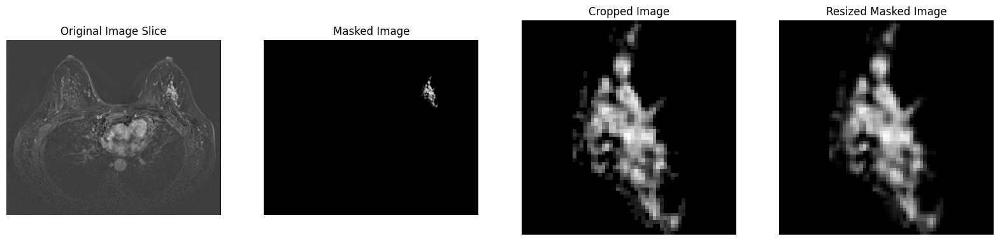

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/212.png
Mean before normalization: 157.59028903388278
Standard deviation before normalization: 25.462623244895042


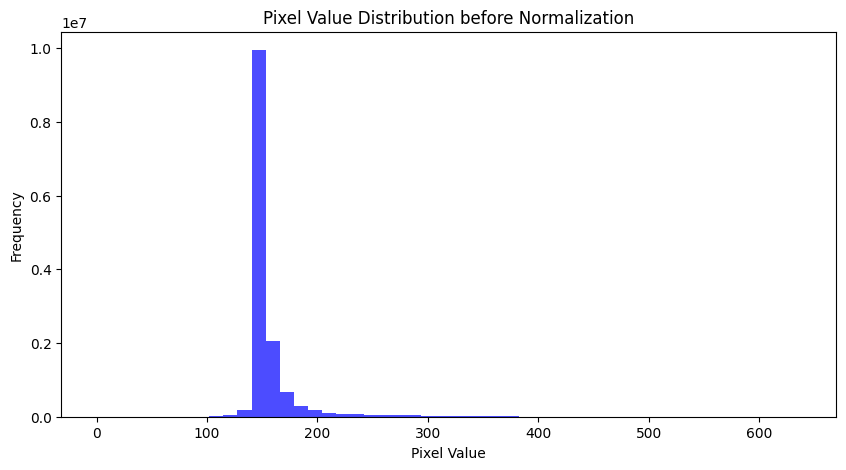

Mean after normalization: -6.715019261029518e-16
Standard deviation after normalization: 99.99999999999987


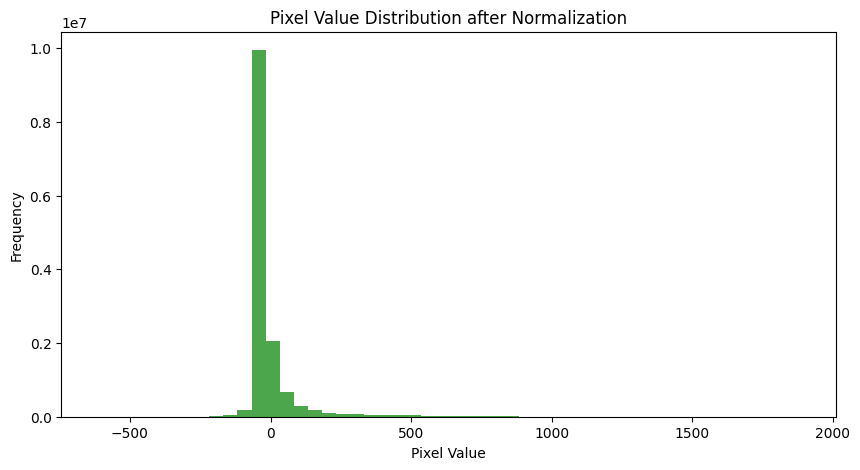

Interval where most values are located (IQR): -53.37348356912706 - 9.463718419508623


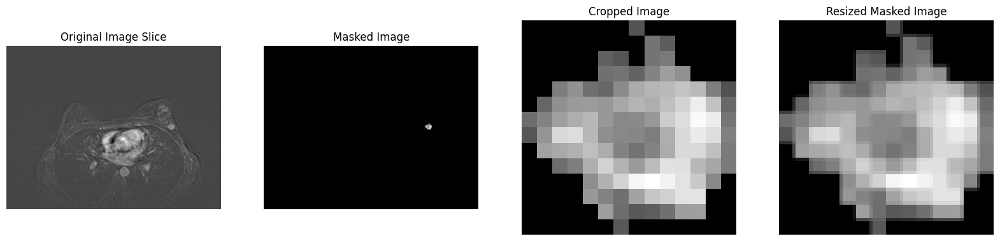

Saved resized mask image: /content/drive/My Drive/MASK/ANALYSED IMAGES/META/213.png

Analysed files in META:
124.nrrd - Segment size: 200 voxels - Voxel count for normalization: 11038720
127.nrrd - Segment size: 1761 voxels - Voxel count for normalization: 13977600
158.nrrd - Segment size: 748 voxels - Voxel count for normalization: 11601920
18.nrrd - Segment size: 183 voxels - Voxel count for normalization: 13312000
31.nrrd - Segment size: 380 voxels - Voxel count for normalization: 11601920
33.nrrd - Segment size: 661 voxels - Voxel count for normalization: 13312000
41.nrrd - Segment size: 301 voxels - Voxel count for normalization: 12646400
87.nrrd - Segment size: 628 voxels - Voxel count for normalization: 13271040
99.nrrd - Segment size: 283 voxels - Voxel count for normalization: 12845056
165.nrrd - Segment size: 1484 voxels - Voxel count for normalization: 13977600
169.nrrd - Segment size: 134 voxels - Voxel count for normalization: 10700800
181.nrrd - Segment size: 428 voxels -

<ipython-input-8-6bf1ff987650>:189: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(include_top=False, weights='imagenet', input_tensor=Input(shape=input_shape))


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - AUC: 0.4065 - accuracy: 0.3812 - loss: 1.2222
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - AUC: 0.8283 - accuracy: 0.6759 - loss: 2.5153 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - AUC: 0.8782 - accuracy: 0.8336 - loss: 1.4306 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - AUC: 0.8518 - accuracy: 0.8631 - loss: 0.7211 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - AUC: 0.9764 - accuracy: 0.9705 - loss: 0.1716
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - AUC: 0.9921 - accuracy: 0.9116 - loss: 0.0922 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - AUC: 1.0000 - accuracy: 0.9411 - loss: 0.1308 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - AUC: 1.0000 - accuracy: 0.9411 - loss: 0.1117 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - AUC: 1.0000 - accuracy: 1.0000 - loss: 0.0511 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - AUC: 1.0000 - accur

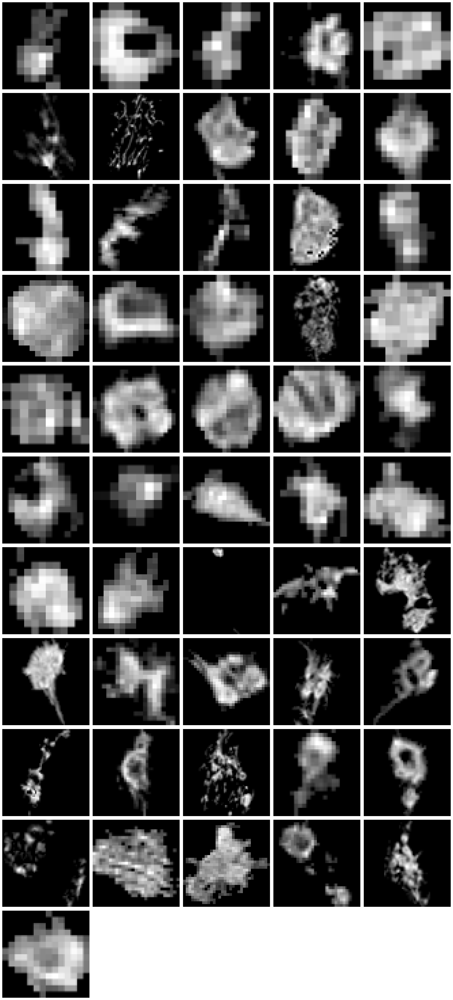

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


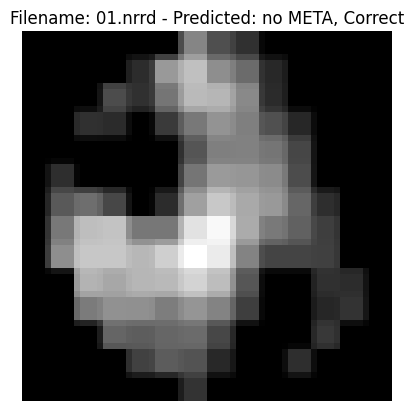

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


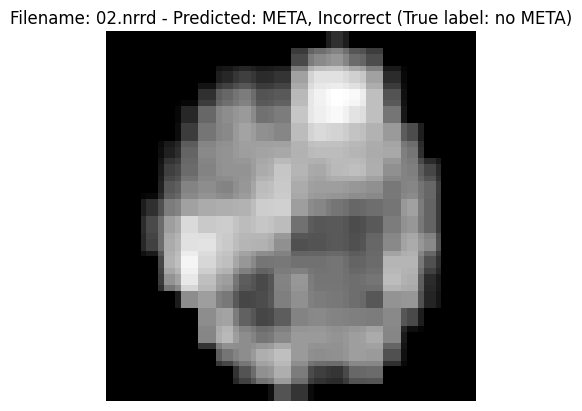

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


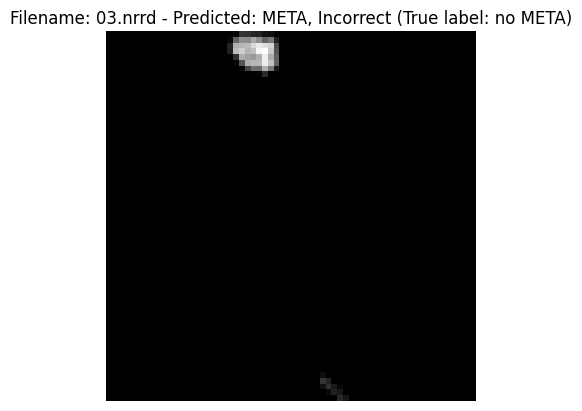

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


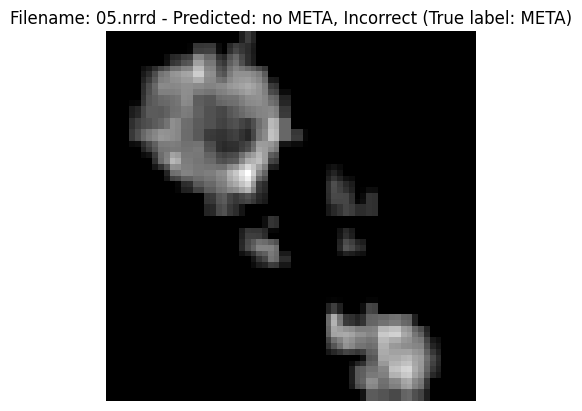

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


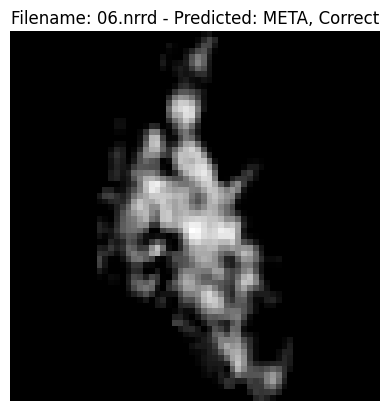

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


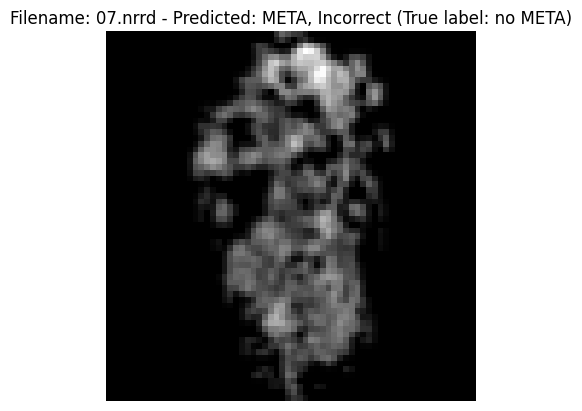

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


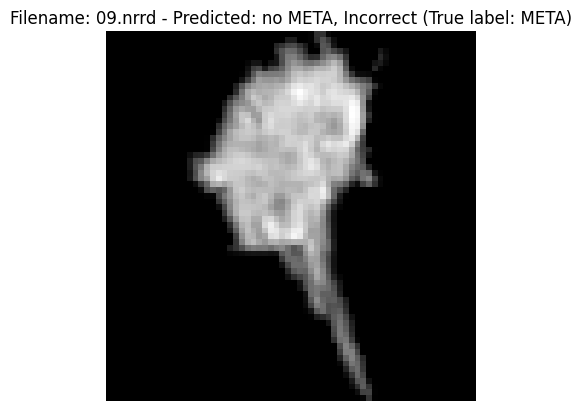

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


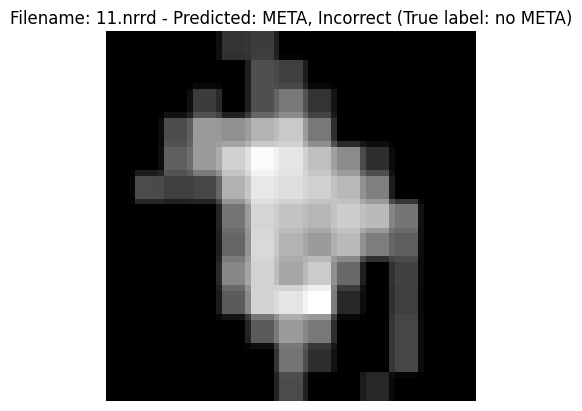

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


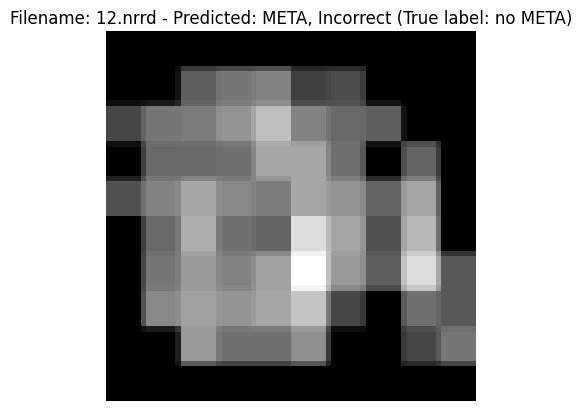

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


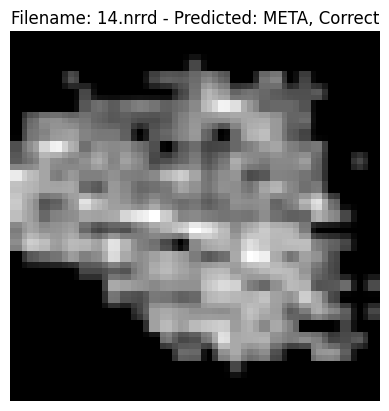

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


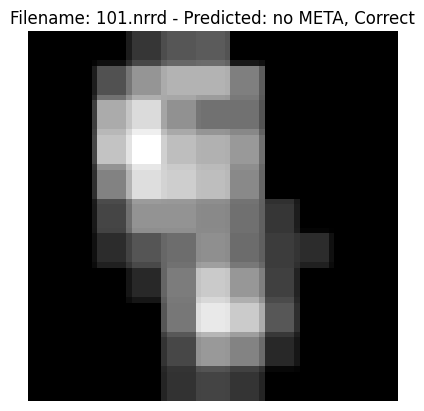

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


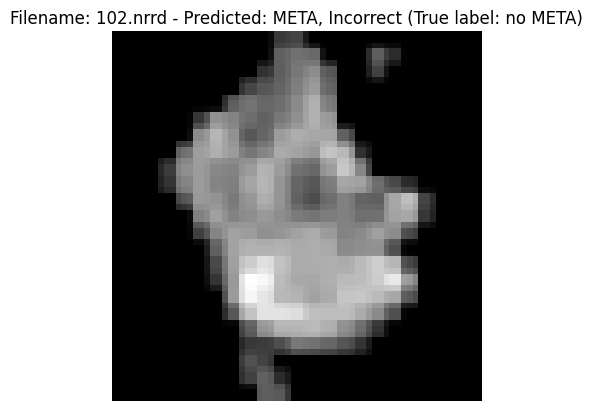

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


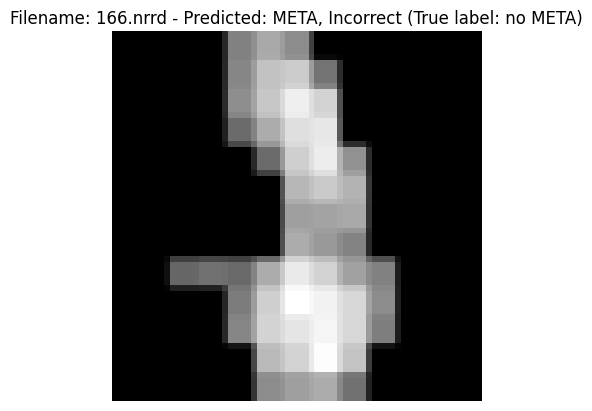

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


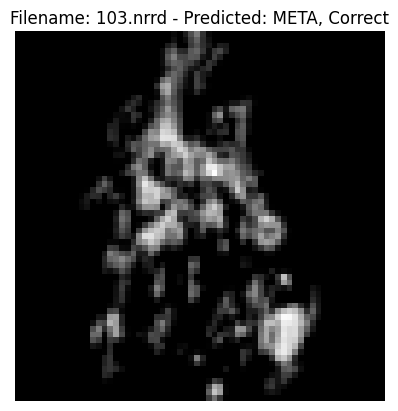

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


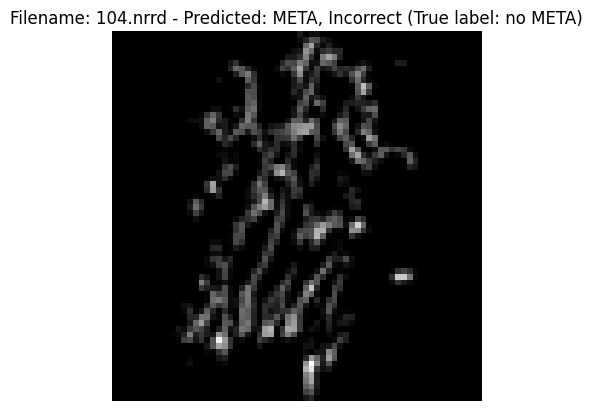

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


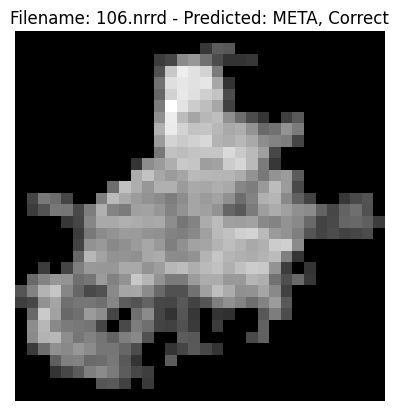

ValueError: min() arg is an empty sequence

In [ ]:
import os
import numpy as np
import SimpleITK as sitk
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score
from scikeras.wrappers import KerasClassifier
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input, MobileNetV2
from tensorflow.keras.optimizers import Adam
import cv2
import tensorflow as tf

data_root = '/content/drive/My Drive/MASK'

def normalize_and_resample(image, target_spacing=[1, 1, 1]):
    img_arr = sitk.GetArrayFromImage(image)
    voxel_count = img_arr.size

    mean_before = np.mean(img_arr)
    std_before = np.std(img_arr)
    print("Mean before normalization:", mean_before)
    print("Standard deviation before normalization:", std_before)

    plt.figure(figsize=(10, 5))
    plt.hist(img_arr.flatten(), bins=50, color='blue', alpha=0.7)
    plt.title('Pixel Value Distribution before Normalization')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.show()

    normalized_img_arr = (img_arr - mean_before) / std_before
    normalized_img_arr *= 100

    mean_after = np.mean(normalized_img_arr)
    std_after = np.std(normalized_img_arr)
    print("Mean after normalization:", mean_after)
    print("Standard deviation after normalization:", std_after)

    plt.figure(figsize=(10, 5))
    plt.hist(normalized_img_arr.flatten(), bins=50, color='green', alpha=0.7)
    plt.title('Pixel Value Distribution after Normalization')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.show()

    q25 = np.percentile(normalized_img_arr, 25)
    q75 = np.percentile(normalized_img_arr, 75)
    iqr = q75 - q25
    lower_bound = q25 - 1.5 * iqr
    upper_bound = q75 + 1.5 * iqr
    print("Interval where most values are located (IQR):", lower_bound, "-", upper_bound)

    normalized_image = sitk.GetImageFromArray(normalized_img_arr)
    normalized_image.CopyInformation(image)

    return normalized_image, voxel_count

def get_largest_slice_index(mask):
    mask_np = sitk.GetArrayFromImage(mask)
    areas = np.sum(mask_np, axis=(1, 2))
    return np.argmax(areas)

def printImages(image_slice, masked_image, cropped_image, final_image):
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    axes[0].imshow(image_slice, cmap='gray')
    axes[0].set_title('Original Image Slice')
    axes[0].axis('off')

    axes[1].imshow(masked_image, cmap='gray')
    axes[1].set_title('Masked Image')
    axes[1].axis('off')

    axes[2].imshow(cropped_image, cmap='gray')
    axes[2].set_title('Cropped Image')
    axes[2].axis('off')

    axes[3].imshow(final_image, cmap='gray')
    axes[3].set_title('Resized Masked Image')
    axes[3].axis('off')

    plt.show()

def preprocess_image_for_model(image_slice, mask_slice, target_shape=(64, 64)):
    if image_slice.shape != mask_slice.shape:
        raise ValueError("Image slice and mask slice shapes do not match")

    masked_image = np.where(mask_slice > 0, image_slice, 0)
    non_zero_coords = np.argwhere(masked_image)
    if non_zero_coords.size == 0:
        raise ValueError("The masked image has no non-zero pixels.")

    top_left = non_zero_coords.min(axis=0)
    bottom_right = non_zero_coords.max(axis=0)

    # Calculate the height and width of the bounding box
    height = bottom_right[0] - top_left[0] + 1
    width = bottom_right[1] - top_left[1] + 1

    # Calculate the side length of the smallest bounding square
    side_length = max(height, width)

    # Calculate the new top-left corner to center the square around the original bounding box
    new_top_left = [
        top_left[0] - (side_length - height) // 2,
        top_left[1] - (side_length - width) // 2
    ]

    # Ensure the new top-left corner is within the image bounds
    new_top_left[0] = max(new_top_left[0], 0)
    new_top_left[1] = max(new_top_left[1], 0)

    # Ensure the new bottom-right corner is within the image bounds
    new_bottom_right = [
        new_top_left[0] + side_length,
        new_top_left[1] + side_length
    ]

    new_bottom_right[0] = min(new_bottom_right[0], masked_image.shape[0])
    new_bottom_right[1] = min(new_bottom_right[1], masked_image.shape[1])

    # Crop the image to the new bounding square
    cropped_image = masked_image[new_top_left[0]:new_bottom_right[0], new_top_left[1]:new_bottom_right[1]]

    # Resize the image to the target shape
    resized_image = cv2.resize(cropped_image, target_shape, interpolation=cv2.INTER_AREA)

    # Create a black canvas and place the resized image on it
    final_image = np.zeros(target_shape)
    resized_height, resized_width = resized_image.shape
    final_image[:resized_height, :resized_width] = resized_image

    # Repeat grayscale image to 3 channels for visualization
    image_resized_rgb = np.repeat(final_image[..., np.newaxis], 3, axis=2)
    printImages(image_slice, masked_image, cropped_image, final_image)

    return preprocess_input(image_resized_rgb), final_image

def process_images_for_analysis(root_path):
    images = []
    labels = []
    filenames = []
    analysed_files, segmented_sizes = {'META': [], 'noMETA': []}, {'META': [], 'noMETA': []}
    subfolders = {'noMETA': 0, 'META': 1}

    for subfolder, label in subfolders.items():
        folder_path = os.path.join(root_path, subfolder)
        print(f"\nProcessing images in {subfolder} folder...")
        for filename in os.listdir(folder_path):
            if 'MASK' not in filename and filename.endswith('.nrrd'):
                image_path = os.path.join(folder_path, filename)
                mask_path = os.path.join(folder_path, filename.replace('.nrrd', 'MASK.nrrd'))
                if os.path.exists(image_path) and os.path.exists(mask_path):
                    image, mask = sitk.ReadImage(image_path), sitk.ReadImage(mask_path)
                    image_preprocessed, voxel_count = normalize_and_resample(image)
                    slice_index = get_largest_slice_index(mask)
                    mean, std = np.mean(sitk.GetArrayFromImage(image_preprocessed)), np.std(sitk.GetArrayFromImage(image_preprocessed))
                    image_slice = sitk.GetArrayFromImage(image_preprocessed)[slice_index, :, :]
                    mask_slice = sitk.GetArrayFromImage(mask)[slice_index, :, :]

                    try:
                        processed_image, final_image = preprocess_image_for_model(image_slice, mask_slice)
                        images.append(processed_image)
                        labels.append(label)
                        filenames.append(filename)
                        segmented_size = np.count_nonzero(mask_slice)
                        analysed_files[subfolder].append((filename, voxel_count))
                        segmented_sizes[subfolder].append(segmented_size)
                        save_path = os.path.join(root_path, 'ANALYSED IMAGES', subfolder)
                        os.makedirs(save_path, exist_ok=True)
                        final_image_path = os.path.join(save_path, filename.replace('.nrrd', '.png'))
                        plt.imsave(final_image_path, final_image, cmap='gray')
                        print(f"Saved resized mask image: {final_image_path}")
                    except ValueError as e:
                        print(f"Error processing {filename}: {e}")
                else:
                    print(f"Skipped {filename} due to missing files.")

    for folder in analysed_files:
        print(f"\nAnalysed files in {folder}:")
        for i, (file, voxel_count) in enumerate(analysed_files[folder]):
            print(f"{file} - Segment size: {segmented_sizes[folder][i]} voxels - Voxel count for normalization: {voxel_count}")
    return np.array(images), np.array(labels), filenames

def build_model(input_shape=(64, 64, 3)):
    base_model = MobileNetV2(include_top=False, weights='imagenet', input_tensor=Input(shape=input_shape))
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    for layer in base_model.layers:
        layer.trainable = False
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'AUC'])
    return model

def display_analyzed_images_in_grid(images, images_per_row=5):
    if len(images) == 0:
        print("No images to display.")
        return

    n_rows = (len(images) + images_per_row - 1) // images_per_row
    plt.figure(figsize=(20, n_rows * 4))

    for i, img in enumerate(images):
        plt.subplot(n_rows, images_per_row, i + 1)
        plt.imshow(img[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Wrap the model with KerasClassifier
keras_model = KerasClassifier(model=build_model, epochs=10, batch_size=32, verbose=1)

images, labels, filenames = process_images_for_analysis(data_root)

X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=42, stratify=labels)

keras_model.fit(X_train, y_train)
predictions = keras_model.predict(X_test)
predicted_classes = (predictions > 0.5).astype(int)
accuracy = accuracy_score(y_test, predicted_classes)
try:
    auc = roc_auc_score(y_test, predictions)
except ValueError:
    auc = "N/A"
f1 = f1_score(y_test, predicted_classes, zero_division=1)

print(f"Accuracy: {accuracy:.4f}, AUC: {auc}, F1 Score: {f1:.4f}")

display_analyzed_images_in_grid(images, images_per_row=5)

# Display and store predictions for all images in the test set with filenames and risk scores
risk_scores = []
for i, (image_to_predict, label_to_predict, filename) in enumerate(zip(X_test, y_test, filenames)):
    preprocessed_img_to_predict = preprocess_input(image_to_predict)
    prediction = keras_model.predict(np.expand_dims(preprocessed_img_to_predict, axis=0))
    predicted_class = (prediction > 0.5).astype(int)
    risk_score = prediction[0]  # Extract the risk score

    risk_scores.append((filename, risk_score, predicted_class, label_to_predict))

    plt.imshow(image_to_predict[:, :, 0], cmap='gray')
    plt.axis('off')
    if predicted_class == label_to_predict:
        plt.title(f"Filename: {filename} - Predicted: {'META' if predicted_class else 'no META'}, Correct")
    else:
        plt.title(f"Filename: {filename} - Predicted: {'META' if predicted_class else 'no META'}, Incorrect (True label: {'META' if label_to_predict else 'no META'})")
    plt.show()





import pandas as pd

# Other code above this remains unchanged

# Print the risk scores
risk_scores = []
for filename, risk_score, predicted_class, true_label in risk_scores:
    print(f"Filename: {filename} - Risk Score: {risk_score:.4f} - Predicted: {'META' if predicted_class else 'no META'} - True Label: {'META' if true_label else 'no META'}")

# Print the range of risk scores over all images
min_score = min(risk_scores, key=lambda x: x[1])[1]
max_score = max(risk_scores, key=lambda x: x[1])[1]
print(f"Range of risk scores: {min_score:.4f} - {max_score:.4f}")

# Determine the cutoff value for classification
cutoff_value = 0.5
print(f"Cutoff value for classification: {cutoff_value:.4f}")

# Create a DataFrame for the risk scores
df_risk_scores = pd.DataFrame(risk_scores, columns=['Filename', 'Risk Score', 'Predicted Class', 'True Label'])

# Define the path for the new folder and create it if it does not exist
risk_scores_folder = os.path.join('/content/drive/My Drive/MASK', 'RISK_SCORES')
os.makedirs(risk_scores_folder, exist_ok=True)

# Define the path for the Excel file
risk_scores_file_path = os.path.join(risk_scores_folder, 'risk_scores.xlsx')

# Save the DataFrame to an Excel file
df_risk_scores.to_excel(risk_scores_file_path, index=False)
print(f"Risk scores saved to {risk_scores_file_path}")

from sklearn.model_selection import cross_validate

# Perform cross-validation
scoring = ['accuracy', 'roc_auc', 'f1']
fold_results = cross_validate(keras_model, X_train, y_train, cv=5, scoring=scoring)

# Calculate metrics
average_accuracy = np.mean(fold_results['test_accuracy'])
average_auc = np.mean(fold_results['test_roc_auc'])
average_f1 = np.mean(fold_results['test_f1'])

print(f"\nCross-Validation Results:")
print(f"Average Accuracy: {average_accuracy:.4f}")
print(f"Average AUC: {average_auc:.4f}")
print(f"Average F1 Score: {average_f1:.4f}")






In [ ]:
# GRAD-CAM

import os
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # Ensure that model.input is a KerasTensor
    inputs = model.inputs if isinstance(model.inputs, list) else [model.inputs]

    grad_model = tf.keras.models.Model(
        inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_gradcam_with_heatmap(img, heatmap, filename, alpha=0.4, save_path="/content/drive/My Drive/MASK/GRADCAM"):
    os.makedirs(save_path, exist_ok=True)

    # Ensure the heatmap has valid values
    heatmap = np.nan_to_num(heatmap)

    # Convert heatmap to RGB
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Resize heatmap to match the original image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Superimpose the heatmap on the original image
    superimposed_img = heatmap * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

    # Convert BGR (OpenCV format) back to RGB for saving
    superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

    # Ensure the filename has the correct extension
    gradcam_image_path = os.path.join(save_path, f"GRADCAM_{filename}.png")
    cv2.imwrite(gradcam_image_path, superimposed_img)
    print(f"Grad-CAM image saved to: {gradcam_image_path}")

def display_gradcam_for_all_images(analyzed_image_paths, model, last_conv_layer_name):
    for image_path in analyzed_image_paths:
        original_img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        original_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_GRAY2RGB)
        preprocessed_img = preprocess_input(original_img_rgb)

        preprocessed_img_expanded = np.expand_dims(preprocessed_img, axis=0)
        heatmap = make_gradcam_heatmap(preprocessed_img_expanded, model, last_conv_layer_name)

        original_img_bgr = cv2.cvtColor(original_img_rgb, cv2.COLOR_RGB2BGR)
        save_gradcam_with_heatmap(original_img_bgr, heatmap, os.path.basename(image_path))

# Collect analyzed image paths
analyzed_image_paths = []
for subfolder in ['noMETA', 'META']:
    folder_path = os.path.join(data_root, 'ANALYSED IMAGES', subfolder)
    analyzed_image_paths.extend([os.path.join(folder_path, fname) for fname in os.listdir(folder_path) if fname.endswith('.png')])

# Display Grad-CAM for all analyzed images
display_gradcam_for_all_images(analyzed_image_paths, keras_model.model_, "Conv_1")


In [ ]:
build_model().summary()